In [3]:
import numpy as np
import matplotlib.pyplot as plt
import json
import os
import pickle
import pandas as pd
import sys
import torch
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import accuracy_score
from collections import defaultdict
import warnings
from scipy.signal import welch
import gc
import cv2
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from matplotlib.patches import Wedge
from scipy.special import softmax
import seaborn as sns


warnings.filterwarnings("ignore", category=FutureWarning, module="torch.storage")

In [4]:
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
sys.path.insert(0, os.path.abspath(os.path.join(os.getcwd(), '..')))

In [5]:
import torch

torch.cuda.is_available()

True

### Figure 1

In [2]:
pickle_path = f'/scratch/mkp6112/LFP/region_decoding/script/spectrogram/Allen'

data = pickle.load(open(f"{pickle_path}/794812542_raw.pickle", 'rb'))
# data = pickle.load(open(f"{pickle_path}/719161530_raw.pickle", 'rb'))
X, y, trial_idx, chan_id = zip(*[(d[0], d[1], d[2], d[3]) for d in data])
X = np.array([x if x.shape[0] == 3749 else x[:3749] for x in X])
y = np.array(y)

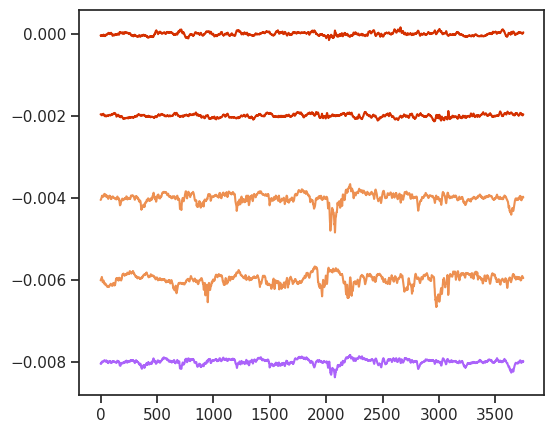

In [149]:
X = np.array(X)
plt.figure(figsize=(6, 5))
colors = ['#d43000', '#ed9051', '#7ec282', '#ab63fa', '#3072b0']

# for i in range(15, 20):
#     plt.plot(X[i]+i*0.005, c='black')

plt.plot(X[y == 4][35]-0*0.002, c=colors[0])
plt.plot(X[y == 4][36]-1*0.002, c=colors[0])
plt.plot(X[y == 0][35]-2*0.002, c=colors[1])
plt.plot(X[y == 0][36]-3*0.002, c=colors[1])
plt.plot(X[y == 3][35]-4*0.002, c=colors[3])

# for cls in range(5):
#     plt.plot(X[y == cls][35]-cls*0.002, c=colors[cls])

In [5]:
pickle_path = f'/scratch/mkp6112/LFP/region_decoding/script/spectrogram/Allen'

data = pickle.load(open(f"{pickle_path}/AD_HF01_1_lfp.pickle", 'rb'))
# data = pickle.load(open(f"{pickle_path}/719161530_raw.pickle", 'rb'))
X, y, trial_idx, chan_id = zip(*[(d[0], d[1], d[2], d[3]) for d in data])
X = np.array([x if x.shape[0] == 3749 else x[:3749] for x in X])
y = np.array(y)

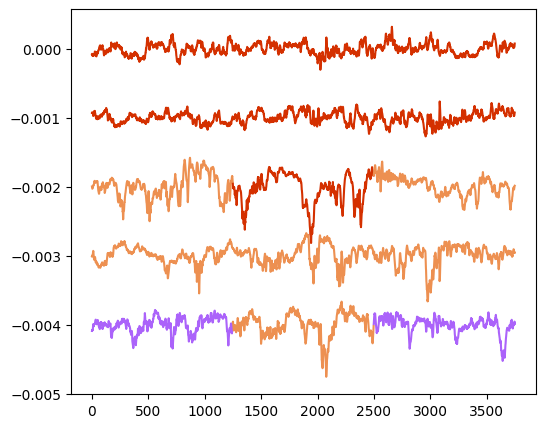

In [12]:
X = np.array(X)
plt.figure(figsize=(6, 5))
# colors = ['#040201', '#040201', '#040201', '#040201', '#040201']
colors = ['#d43000', '#ed9051', '#7ec282', '#ab63fa', '#3072b0']

# for i in range(15, 20):
#     plt.plot(X[i]+i*0.005, c='black')



# plt.plot(X[y == 4][35]*2-0*0.001, c=colors[0])
# plt.plot(X[y == 4][36]*2-1*0.001, c=colors[0])
# plt.plot(X[y == 0][28]-2*0.001, c=colors[1])
# plt.plot(X[y == 0][36]-3*0.001, c=colors[1])
# plt.plot(X[y == 3][35]*2-4*0.001, c=colors[3])

data = X[y == 4][35]*2-0*0.001
n = len(data)
third = len(data) // 3

plt.plot(range(0, third), data[0:third], c=colors[0])
plt.plot(range(third, 2*third), data[third:2*third], c=colors[0])
plt.plot(range(2*third, n), data[2*third:], c=colors[0])

data = X[y == 4][36]*2-1*0.001
third = len(data) // 3

plt.plot(range(0, third), data[0:third], c=colors[0])
plt.plot(range(third, 2*third), data[third:2*third], c=colors[0])
plt.plot(range(2*third, n), data[2*third:], c=colors[0])


data = X[y == 0][28]-2*0.001
third = len(data) // 3

plt.plot(range(0, third), data[0:third], c=colors[1])
plt.plot(range(third, 2*third), data[third:2*third], c=colors[0])
plt.plot(range(2*third, n), data[2*third:], c=colors[1])

plt.plot(X[y == 0][36]-3*0.001, c=colors[1])

data = X[y == 3][35]*2-4*0.001
third = len(data) // 3

plt.plot(range(0, third), data[0:third], c=colors[3])
plt.plot(range(third, 2*third), data[third:2*third], c=colors[1])
plt.plot(range(2*third, n), data[2*third:], c=colors[3])

# plt.savefig('raw_trace.png', dpi=300)
plt.savefig('trace.png', dpi=300)

# for cls in range(5):
#     plt.plot(X[y == cls][35]-cls*0.002, c=colors[cls])

In [ ]:
plt.plot(X[y == 4][35]-0*0.002, c=colors[0])
plt.plot(X[y == 4][36]-1*0.002, c=colors[0])
plt.plot(X[y == 0][35]-2*0.002, c=colors[1])
plt.plot(X[y == 0][36]-3*0.002, c=colors[1])
plt.plot(X[y == 3][35]-4*0.002, c=colors[3])

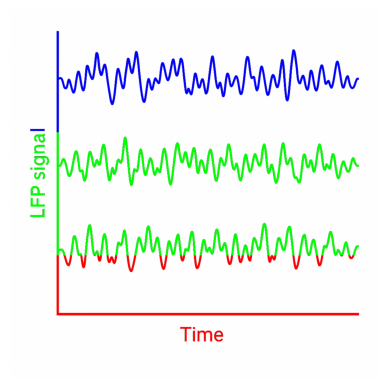

In [20]:


# Load the image
image_path = 'signal.png'
img = cv2.imread(image_path)

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Threshold to detect black signal lines
_, thresh = cv2.threshold(gray, 50, 255, cv2.THRESH_BINARY_INV)

# Get mask of signal lines
signal_mask = thresh > 0

# Get image dimensions
height = img.shape[0]
band_height = height // 3

# Define colors in BGR (OpenCV format)
colors = [
    (255, 0, 0),   # Blue for top
    (0, 255, 0),   # Green for middle
    (0, 0, 255)    # Red for bottom
]

# Color each horizontal band
for i in range(3):
    start = i * band_height
    end = (i + 1) * band_height if i < 2 else height
    band_mask = np.zeros_like(signal_mask)
    band_mask[start:end, :] = signal_mask[start:end, :]
    img[band_mask] = colors[i]

# Show result
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

### Figure 2

In [15]:
results_path = {
    # 'raw': {
    #     'Neuronexus': '/scratch/th3129/region_decoding/results/Neuronexus/raw/mlp/',
    #     'Allen': '/scratch/mkp6112/LFP/region_decoding/results/Allen/raw/MLP/',
    #     'ibl': '/scratch/th3129/region_decoding/results/ibl/raw/MLP/'
    # },
    'spectrogram': {
        'Neuronexus': '/scratch/th3129/region_decoding/results/Neuronexus/spectrogram/MLP/',
        'Allen': '/scratch/mkp6112/LFP/region_decoding/results/Allen/spectrogram/MLP/',
        'ibl': '/scratch/th3129/region_decoding/results/ibl/spectrogram/MLP/'
    },
    'simclr': {
        'Neuronexus': '/scratch/mkp6112/LFP/region_decoding/results/Neuronexus/spectrogram/SimCLR_MLP/',
        'Allen': '/scratch/mkp6112/LFP/region_decoding/results/Allen/spectrogram/SimCLR_MLP/',
        'ibl': '/scratch/mkp6112/LFP/region_decoding/results/ibl/spectrogram/SimCLR_MLP/'
    },
    'brainbert': {
        'Neuronexus': '/scratch/nar8991/LFP_CLEAN/region_decoding/results_FOR_EMBEDDINGS_new/Neuronexus/spectrogram/BrainBERT/new_format/',
        'Allen': '/scratch/nar8991/LFP_CLEAN/region_decoding/results_FOR_EMBEDDINGS_new/Allen/spectrogram/BrainBERT/new_format/',
        'ibl': '/scratch/nar8991/LFP_CLEAN/region_decoding/results_FOR_EMBEDDINGS_new/ibl/spectrogram/BrainBERT/new_format/'
    },
    # 'wav2vec': {
    #     'Neuronexus': '/scratch/th3129/region_decoding/results/Neuronexus/spectrogram_preprocessed/wave2vec2/across_session/',
    #     'Allen': '/scratch/th3129/region_decoding/results/Allen/spectrogram/wave2vec2/across_session/',
    #     'ibl': '/scratch/mkp6112/LFP/region_decoding/results/ibl/spectrogram/wave2vec2/across_session/'
    # },
    'wav2vec': {
        'Neuronexus': '/scratch/th3129/region_decoding/results/Neuronexus/spectrogram_preprocessed/wave2vec2/across_session/',
        'Allen': '/scratch/th3129/region_decoding/results/Allen/spectrogram_preprocessed/wave2vec2/across_session/',
        'ibl': '/scratch/th3129/region_decoding/results/ibl/spectrogram_preprocessed/wave2vec2/across_session/'
    }
}

In [7]:
sessions = {
    'Neuronexus': ['AD_HF01_1', 'AD_HF02_2', 'AD_HF02_4', 'AD_HF03_1', 'AD_HF03_2', 'NN_syn_01', 'NN_syn_02'],
    'Allen': ['719161530', '794812542', '778998620', '798911424', '771990200', '771160300', '768515987'],
    'ibl': ['0802ced5-33a3-405e-8336-b65ebc5cb07c_probe00','0802ced5-33a3-405e-8336-b65ebc5cb07c_probe01',
                '0a018f12-ee06-4b11-97aa-bbbff5448e9f_probe00','3638d102-e8b6-4230-8742-e548cd87a949_probe01',
                '5dcee0eb-b34d-4652-acc3-d10afc6eae68_probe00','d2832a38-27f6-452d-91d6-af72d794136c_probe00',
                '54238fd6-d2d0-4408-b1a9-d19d24fd29ce_probe00']
}

In [8]:
def read_pickle(file_path):
    with open(file_path, 'rb') as f:
        try:
            return pickle.load(f)
        except RuntimeError as e:
            raise RuntimeError(f"Failed to load {file_path} with torch.load(): {e}")

In [9]:
def extract_class_acc(results):
    if isinstance(results['test_logits'], torch.Tensor):
        logits = results['test_logits'].detach().cpu().numpy()
    else:
        logits = results['test_logits']
    labels = np.array(results['test_labels']).astype(int)
    pred = np.argmax(logits, axis=1)

    class_acc = {}
    brain_regions = ['CA1', 'CA2', 'CA3', 'DG', 'Cortex']
    # print(labels)

    for label_cls in np.unique(labels):
        cls_mask = labels == label_cls
        correct = np.sum(pred[cls_mask] == labels[cls_mask])
        total = np.sum(cls_mask)
        class_acc[brain_regions[int(label_cls)]] = correct / total if total > 0 else float('nan')

    cm = confusion_matrix(labels, pred, labels=range(len(brain_regions)))
    f1_macro = f1_score(labels, pred, average='macro')
    f1_micro = f1_score(labels, pred, average='micro')
    f1_weighted = f1_score(labels, pred, average='weighted')
    balanced_acc = balanced_accuracy_score(labels, pred)
    f1 = {"f1_macro": f1_macro, "f1_micro": f1_micro, "f1_weighted": f1_weighted, "balanced_acc": balanced_acc}

    return class_acc, cm, f1

In [10]:
def calculate_chance_accuracy(y_labels):
    label_counts = {}
    for label in y_labels:
        label_counts[label] = label_counts.get(label, 0) + 1
    chance_accuracy = max(label_counts.values()) / sum(label_counts.values())
    return label_counts, chance_accuracy

def edit_pickle_by_trials(result_pickle, test_trials, dataset):
    updated_pickle = result_pickle.copy()
    
    test_trial_chans = result_pickle['test_trial_chans']

    if dataset == 'Allen':
        session_trial_channel = np.array([s.split("_") for s in test_trial_chans])
    else:
        session_trial_channel = np.array([s.rsplit("_", 2) for s in test_trial_chans])

    mask = np.isin(session_trial_channel[:, 1].astype(int), test_trials)

    test_attributes = ['test_logits', 'test_labels', 'test_embeddings', 'test_trial_chans']

    for attribute in test_attributes:
        data_array = result_pickle[attribute]
        if isinstance(data_array, torch.Tensor):
            data_array = data_array.detach().cpu().numpy()
        if isinstance(data_array, np.ndarray):
            updated_pickle[attribute] = data_array[mask]
        else:
            updated_pickle[attribute] = [item for item, keep in zip(data_array, mask) if keep]

    labels = np.array(updated_pickle['test_labels']).astype(int)
    pred = np.argmax(updated_pickle['test_logits'], axis=1)
    updated_pickle['test_acc'] = sum(labels == pred) / len(labels)

    label_counts, chance_accuracy = calculate_chance_accuracy(updated_pickle['test_labels'])
    updated_pickle['test_chance_accuracy'] = chance_accuracy
    updated_pickle['test_label_counts'] = label_counts
    print(f"acc before: {result_pickle['test_acc']}, acc after: {updated_pickle['test_acc']}")

    return updated_pickle

In [9]:
accuracy_ls = []
conf_mtx_ls = defaultdict(lambda: defaultdict(dict))
test_trials = [0, 5, 36, 45, 13, 54, 33, 48, 12, 57, 46, 50]

for model in list(results_path.keys()):
    for dataset in sessions.keys():
        print(results_path[model][dataset])
        for file in os.listdir(results_path[model][dataset]):
            formated_file = file.replace('_across_session.pickle', '_results.pickle')
            current_session = formated_file.replace('_results.pickle', '')

            if model == 'wav2vec':
                current_session = formated_file.replace('_pretrained_ssl_rpoiVg_results.pickle', '')
                
            if formated_file.endswith('_results.pickle') and any(session==current_session for session in sessions[dataset]):
                saved_data = read_pickle(results_path[model][dataset] + file)

                if model == 'brainbert' or model == 'simclr':
                    saved_data = edit_pickle_by_trials(saved_data, test_trials, dataset)
                    
                if 'test_chance_accuracy' not in saved_data:
                    saved_data['test_chance_accuracy'] = float('nan') 
                    
                result = {"model": model, "dataset": dataset, "session": current_session,
                                    'train_acc': saved_data['train_acc'], 'val_acc': saved_data['val_acc'], 
                                    'test_acc': saved_data['test_acc'], 'chance_acc':saved_data['test_chance_accuracy']}
                # print(result)
                class_acc, cm, f1 = extract_class_acc(saved_data)
                result.update(class_acc)
                result.update(f1)

                accuracy_ls.append(result)
                conf_mtx_ls[model][dataset][current_session] = cm

/scratch/th3129/region_decoding/results/Neuronexus/spectrogram/MLP/
/scratch/mkp6112/LFP/region_decoding/results/Allen/spectrogram/MLP/


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


/scratch/th3129/region_decoding/results/ibl/spectrogram/MLP/


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


/scratch/mkp6112/LFP/region_decoding/results/Neuronexus/spectrogram/SimCLR_MLP/
acc before: 0.6961538461538461, acc after: 0.7019230769230769


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.6090840840840841, acc after: 0.6088588588588588
acc before: 0.720118495620814, acc after: 0.73145285935085
acc before: 0.49101941747572814, acc after: 0.4741100323624595


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.59666968053044, acc after: 0.5958408679927667
acc before: 0.6665785764622973, acc after: 0.6724806201550387


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.6656833824975418, acc after: 0.6632251720747296
/scratch/mkp6112/LFP/region_decoding/results/Allen/spectrogram/SimCLR_MLP/


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.6862344236760125, acc after: 0.6814641744548287
acc before: 0.6651585820895523, acc after: 0.6621890547263681
acc before: 0.7071200284090909, acc after: 0.7054924242424242


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.6423168789808917, acc after: 0.6385350318471338
acc before: 0.6564732142857143, acc after: 0.6592857142857143
acc before: 0.712633634868421, acc after: 0.6573464912280702
acc before: 0.7217711480362538, acc after: 0.7177744209466264
/scratch/mkp6112/LFP/region_decoding/results/ibl/spectrogram/SimCLR_MLP/
acc before: 0.6940670289855072, acc after: 0.6965579710144928
acc before: 0.8246031746031746, acc after: 0.8071428571428572


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.8088768115942029, acc after: 0.7903079710144928
acc before: 0.7600081699346405, acc after: 0.7806372549019608


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.8134057971014492, acc after: 0.8220108695652174
acc before: 0.6472378277153558, acc after: 0.6605805243445693
acc before: 0.7204861111111112, acc after: 0.7353395061728395
/scratch/nar8991/LFP_CLEAN/region_decoding/results_FOR_EMBEDDINGS_new/Neuronexus/spectrogram/BrainBERT/new_format/
acc before: 0.5383838859006603, acc after: 0.7326923076923076


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.48231204507188496, acc after: 0.5587378640776699


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.414429444610966, acc after: 0.504424778761062


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.5512309566789674, acc after: 0.6201201201201201
acc before: 0.4598878205128205, acc after: 0.5607293550331525
acc before: 0.4905719459751718, acc after: 0.6084492529623905
acc before: 0.5260791482791006, acc after: 0.5202607470049331
/scratch/nar8991/LFP_CLEAN/region_decoding/results_FOR_EMBEDDINGS_new/Allen/spectrogram/BrainBERT/new_format/


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.5135766480894434, acc after: 0.7643504531722054
acc before: 0.6620027583120255, acc after: 0.7305871212121212


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.45623331147430723, acc after: 0.6942786069651742
acc before: 0.5867273819991694, acc after: 0.7544132917964693
acc before: 0.4901136853582318, acc after: 0.6444627192982456
acc before: 0.4771190749345777, acc after: 0.6928571428571428
acc before: 0.4685452443024136, acc after: 0.7300955414012739
/scratch/nar8991/LFP_CLEAN/region_decoding/results_FOR_EMBEDDINGS_new/ibl/spectrogram/BrainBERT/new_format/
acc before: 0.7555853174603175, acc after: 0.7450181159420289


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.7735926314970433, acc after: 0.782608695652174


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.7927944862155387, acc after: 0.7888888888888889


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.6375005180702917, acc after: 0.8052536231884058
acc before: 0.8294307238272755, acc after: 0.8366013071895425


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


acc before: 0.5758878734912894, acc after: 0.6739969135802469
acc before: 0.5995960804554554, acc after: 0.7265917602996255
/scratch/th3129/region_decoding/results/Neuronexus/spectrogram_preprocessed/wave2vec2/across_session/


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


/scratch/th3129/region_decoding/results/Allen/spectrogram_preprocessed/wave2vec2/across_session/


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


/scratch/th3129/region_decoding/results/ibl/spectrogram_preprocessed/wave2vec2/across_session/


/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
/ext3/miniforge3/envs/blind_localization/lib/python3.11/site-packages/sklearn/metrics/_classification.py:2480: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")


In [32]:
accuracy = pd.DataFrame(accuracy_ls)
accuracy[accuracy['model'] == 'wav2vec']

,model,dataset,session,train_acc,val_acc,test_acc,chance_acc,CA1,CA3,DG,Cortex,f1_macro,f1_micro,f1_weighted,balanced_acc,CA2
63,wav2vec,Neuronexus,NN_syn_01,0.931734,0.750976,0.676276,0.347748,0.613225,0.634524,0.609756,0.841969,0.573198,0.676276,0.677608,0.582843,0.214744
64,wav2vec,Neuronexus,AD_HF03_2,0.912652,0.731362,0.658333,0.469231,0.728723,0.638889,0.590164,0.706140,0.475488,0.658333,0.711755,0.665979,NaN
65,wav2vec,Neuronexus,NN_syn_02,0.934164,0.717213,0.502562,0.298373,0.814815,0.389241,0.371795,0.454545,0.413033,0.502562,0.508011,0.421231,0.075758
66,wav2vec,Neuronexus,AD_HF02_4,0.881527,0.706331,0.760042,0.475687,0.575069,NaN,0.559711,0.972593,0.437567,0.760042,0.761627,0.702458,NaN
67,wav2vec,Neuronexus,AD_HF01_1,0.452939,0.651050,0.540829,0.527048,0.000000,0.000000,0.997619,0.718964,0.245483,0.540829,0.464852,0.343317,0.000000
68,wav2vec,Neuronexus,AD_HF02_2,0.572774,0.818684,0.708091,0.413592,0.485663,NaN,0.570244,0.988654,0.497539,0.708091,0.701967,0.511140,0.000000
69,wav2vec,Neuronexus,AD_HF03_1,0.903563,0.820672,0.647001,0.404130,0.710317,NaN,0.497567,0.923077,0.482054,0.647001,0.658697,0.593047,0.241228
70,wav2vec,Allen,794812542,0.954407,0.829540,0.831963,0.483553,0.881279,0.563725,0.584615,0.958050,0.613426,0.831963,0.829463,0.614201,0.083333
71,wav2vec,Allen,771160300,0.956756,0.821205,0.865005,0.464174,0.817927,0.814394,0.827381,0.931208,0.706753,0.865005,0.864053,0.711515,0.166667
72,wav2vec,Allen,768515987,0.945836,0.844418,0.880573,0.439490,0.918440,0.556667,0.842424,0.941425,0.665124,0.880573,0.875870,0.651791,0.000000


/state/partition1/job-60834195/ipykernel_2909804/3140444250.py:13: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Brain Region', y='Class Accuracy', hue='model', data=df_melted, palette=color_map, ci='sd',capsize=0.1, width=0.5)


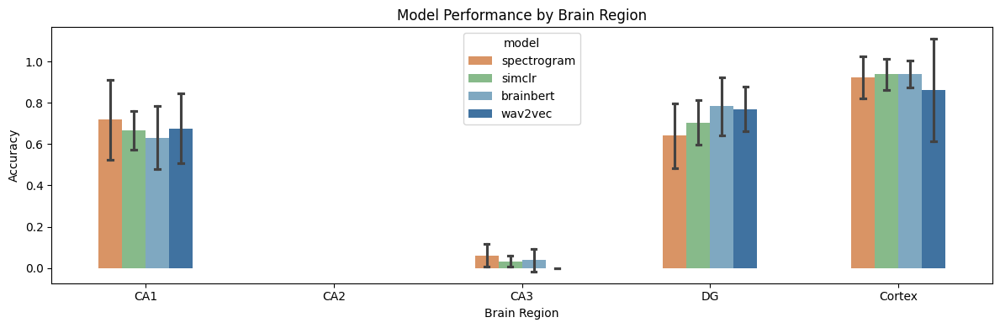

In [12]:
import seaborn as sns

df_melted = accuracy[accuracy['dataset']=='ibl'].melt(
    id_vars=['model', 'session'],
    value_vars=['CA1', 'CA2', 'CA3', 'DG', 'Cortex'],
    var_name='Brain Region',
    value_name='Class Accuracy'
)

plt.figure(figsize=(12, 4))
color_map = {'raw':'#d43000', 'spectrogram':'#ed9051', 'simclr':'#7ec282', 'brainbert':'#74abcc', 'wav2vec':'#3072b0'}

sns.barplot(x='Brain Region', y='Class Accuracy', hue='model', data=df_melted, palette=color_map, ci='sd',capsize=0.1, width=0.5)

# sns.boxplot(x='Brain Region', y='Class Accuracy', data=df_melted)
plt.title('Model Performance by Brain Region')
plt.ylabel('Accuracy')
plt.xlabel('Brain Region')
plt.tight_layout()
plt.show()

In [13]:
label_map = {
    'raw': 'Raw',
    'spectrogram': 'Spectrogram',
    'simclr': 'SimCLR',
    'brainbert': 'BrainBERT',
    'wav2vec': 'ours'
}

accuracy['model_display'] = accuracy['model'].map(label_map)

/state/partition1/job-60834195/ipykernel_2909804/140126911.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  ax = sns.barplot(
/state/partition1/job-60834195/ipykernel_2909804/140126911.py:12: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1.5}` instead.

  ax = sns.barplot(


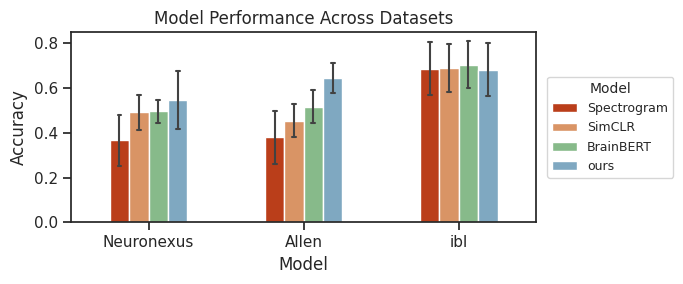

In [14]:
import seaborn as sns
# Example: assuming your DataFrame is called df
# df = pd.read_csv("your_data.csv")  # if loading from CSV

# Set the plot style
sns.set(style="ticks")
color_map = {'Raw':'#d43000', 'Spectrogram':'#d43000', 'SimCLR':'#ed9051', 'BrainBERT':'#7ec282', 'ours':'#74abcc'}

# Create a boxplot: Metric vs Model, separated by Dataset
plt.figure(figsize=(7, 3))
# sns.boxplot(x='dataset', y='test_acc', hue='model', data=accuracy, palette=color_map, width=0.3, fliersize=3, linewidth=1)
ax = sns.barplot(
    x='dataset', 
    y='balanced_acc', 
    hue='model_display', 
    data=accuracy, 
    palette=color_map, 
    ci='sd',        # show standard deviation
    capsize=0.1,     # adds caps to error bars
    errwidth=1.5,
    width=0.5
)
        
# Add titles and labels
plt.legend(title='Model', fontsize=9, title_fontsize=10, loc='center left', frameon=True, bbox_to_anchor=(1.01, 0.5))

plt.title('Model Performance Across Datasets')
plt.xlabel('Model')
plt.ylabel('Accuracy')
# plt.legend().remove()
plt.tight_layout()
plt.savefig('accuracy.png', dpi=300)


/state/partition1/job-60834195/ipykernel_2909804/3836349767.py:11: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  ax = sns.barplot(
/state/partition1/job-60834195/ipykernel_2909804/3836349767.py:11: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1.5}` instead.

  ax = sns.barplot(


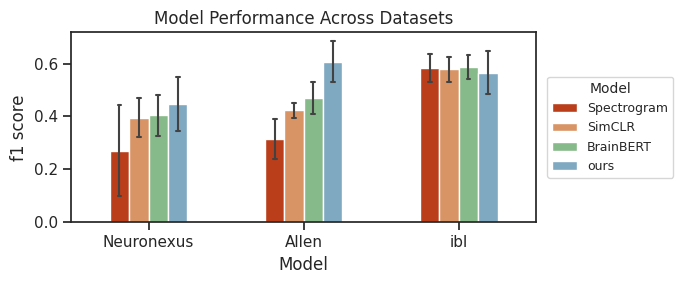

In [15]:

# Example: assuming your DataFrame is called df
# df = pd.read_csv("your_data.csv")  # if loading from CSV

# Set the plot style
sns.set(style="ticks")
color_map = {'Raw':'#d43000', 'Spectrogram':'#d43000', 'SimCLR':'#ed9051', 'BrainBERT':'#7ec282', 'ours':'#74abcc'}

# Create a boxplot: Metric vs Model, separated by Dataset
plt.figure(figsize=(7, 3))
# sns.boxplot(x='dataset', y='test_acc', hue='model', data=accuracy, palette=color_map, width=0.3, fliersize=3, linewidth=1)
ax = sns.barplot(
    x='dataset', 
    y='f1_macro', 
    hue='model_display', 
    data=accuracy, 
    palette=color_map, 
    ci='sd',        # show standard deviation
    capsize=0.1,     # adds caps to error bars
    errwidth=1.5,
    width=0.5
)
        
# Add titles and labels
plt.legend(title='Model', fontsize=9, title_fontsize=10, loc='center left', frameon=True, bbox_to_anchor=(1.01, 0.5))

plt.title('Model Performance Across Datasets')
plt.xlabel('Model')
plt.ylabel('f1 score')
# plt.legend().remove()
plt.tight_layout()
plt.savefig('f1.png', dpi=300)

In [16]:
def plot_confusion_matrix(cm, class_labels, title='Confusion Matrix', format='.2f', vmin=0, vmax=1):
    sns.heatmap(cm, annot=True, fmt=format, cmap='Blues', xticklabels=class_labels, yticklabels=class_labels, vmin=vmin, vmax=vmax)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)

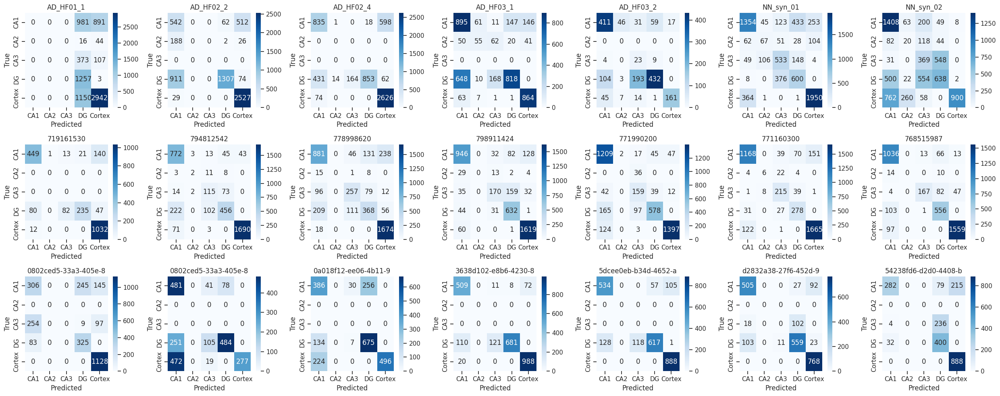

In [23]:
cnt = 1
plt.figure(figsize=(25, 10))
brain_regions = ['CA1', 'CA2', 'CA3', 'DG', 'Cortex']
model = 'wav2vec'

for dataset in sessions.keys():
    for session in sessions[dataset]:
        plt.subplot(3, 7, cnt)
        plot_confusion_matrix(conf_mtx_ls[model][dataset][session], class_labels=brain_regions, title=session[:20], format='d', vmin=None, vmax=None)
        cnt += 1

plt.tight_layout()
plt.show()

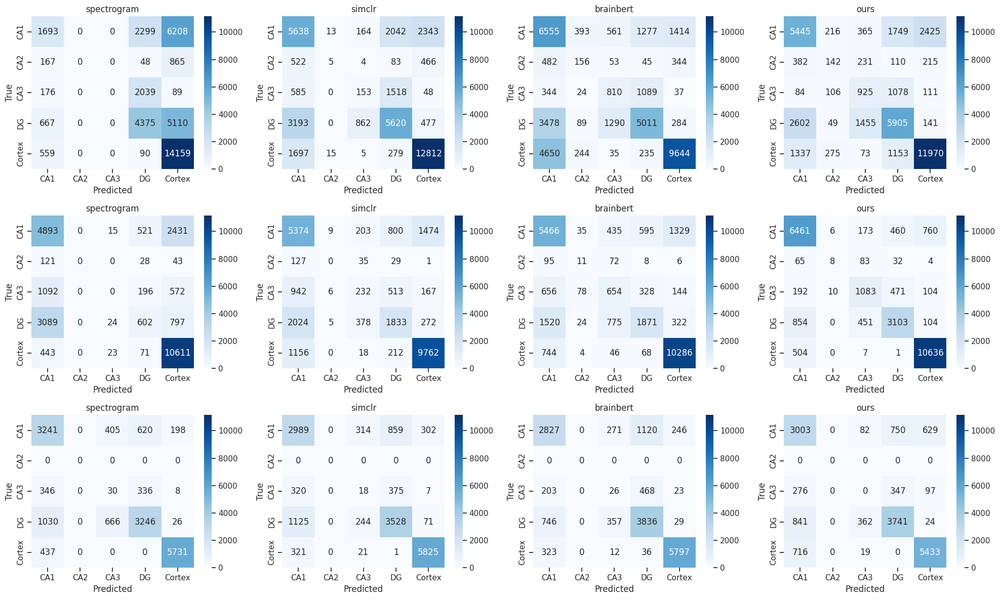

In [26]:
cnt = 1
plt.figure(figsize=(20, 12))
brain_regions = ['CA1', 'CA2', 'CA3', 'DG', 'Cortex']

for dataset in sessions.keys():
    for model in list(results_path.keys()):
        total_cm = np.zeros((5, 5), dtype=int)
        
        for session in sessions[dataset]:
            if session in conf_mtx_ls[model][dataset].keys():
                cm = conf_mtx_ls[model][dataset][session]
                total_cm = cm if total_cm is None else total_cm + cm 
            else:
                print(f"{session} not found in {model}")
            
        plt.subplot(3, 4, cnt)
        model = model if model != 'wav2vec' else 'ours'
        
        # total_cm = total_cm.astype('float') / total_cm.sum(axis=1)[:, np.newaxis]
        # plot_confusion_matrix(total_cm, class_labels=brain_regions, title=f"{model}", format='.2f', vmin=0, vmax=1)
        plot_confusion_matrix(total_cm, class_labels=brain_regions, title=f"{model}", format='d', vmin=0, vmax=11148)
        cnt += 1

plt.tight_layout()
plt.savefig('conf.png', dpi=300)
plt.show()

### Figure 3

In [28]:
across_lab_acc = {
  'IBL_train_Allen_val_NN_test': {
    'train_acc': 0.9514222222222222,
    'val_acc': 0.48998905052401065,
    'test_acc': 0.635799035965888,
    'chance_acc': 0.378568780126066
  },
  'IBL_train_NN_val_Allen_test': {
    'train_acc': 0.9669820618963139,
    'val_acc': 0.490763802407638,
    'test_acc': 0.7260648148148148,
    'chance_acc': 0.44555555555555554
  },
  'NN_train_Allen_val_IBL_test': {
    'train_acc': 0.905965257292691,
    'val_acc': 0.3162834350070389,
    'test_acc': 0.4143401015228426,
    'chance_acc': 0.3779411764705882
  },
  'NN_train_IBL_val_Allen_test': {
    'train_acc': 0.9180230187850849,
    'val_acc': 0.32628676470588236,
    'test_acc': 0.5706944444444444,
    'chance_acc': 0.44555555555555554
  },
  'Allen_train_IBL_val_NN_test': {
    'train_acc': 0.8974447803812883,
    'val_acc': 0.47794117647058826,
    'test_acc': 0.6336670374490174,
    'chance_acc': 0.378568780126066
  },
  'Allen_train_NN_val_IBL_test': {
    'train_acc': 0.8527019873923295,
    'val_acc': 0.543145496056455,
    'test_acc': 0.40369430344049634,
    'chance_acc': 0.37225042301184436
  }
}

In [53]:
across_lab_acc_mtx = np.zeros((3, 3))
raw_cm = np.zeros((3, 3))
labs = ['NN','Allen', 'IBL']

for i, train_lab in enumerate(labs):
    for j, test_lab in enumerate(labs):
        if train_lab != test_lab:
            val_lab = [l for l in labs if l != train_lab and l != test_lab][0]
            across_lab_acc_mtx[i][j] = across_lab_acc[f"{train_lab}_train_{val_lab}_val_{test_lab}_test"]['test_acc']

In [54]:
raw_cm[0][0] = 0.378568780126066
raw_cm[1][1] = 0.44555555555555554
raw_cm[2][2] = 0.37225042301184436

In [55]:
results_path_new = {'wav2vec': {
        'Neuronexus': '/scratch/th3129/region_decoding/results/Neuronexus/spectrogram_preprocessed/wave2vec2/across_session/',
        'Allen': '/scratch/th3129/region_decoding/results/Allen/spectrogram/wave2vec2/across_session/',
        'ibl': '/scratch/mkp6112/LFP/region_decoding/results/ibl/spectrogram/wave2vec2/across_session/'
    }}


for i, dataset in enumerate(sessions.keys()):
    y_trues = []
    y_preds = []

    for file in os.listdir(results_path[model][dataset]):
        formated_file = file.replace('_across_session.pickle', '_results.pickle')
        current_session = formated_file.replace('_results.pickle', '')

        if model == 'wav2vec':
            current_session = formated_file.replace('_pretrained_ssl_rpoiVg_results.pickle', '')
            
        if formated_file.endswith('_results.pickle') and any(session==current_session for session in sessions[dataset]):
            saved_data = read_pickle(results_path[model][dataset] + file)
            y_trues.extend(np.array(saved_data['test_labels']).astype(int))
            y_preds.extend(np.argmax(saved_data['test_logits'], axis=1))

    acc = np.mean(np.array(y_preds) == np.array(y_trues))
    across_lab_acc_mtx[i][i] = acc
    print(dataset, acc)

Neuronexus 0.6327054794520548
Allen 0.8325903331769122
ibl 0.7461397058823529


In [56]:
def plot_confusion_matrix(cm, class_labels, title='Confusion Matrix', format='.2f', vmin=0, vmax=1):
    sns.heatmap(cm, annot=True, fmt=format, cmap='Blues', xticklabels=class_labels, yticklabels=class_labels, vmin=vmin, vmax=vmax, annot_kws={"size": 15})
    plt.xlabel('Test Lab')
    plt.ylabel('Train Lab')
    plt.title(title)
    plt.savefig(f'{title}.png', dpi=300)

In [69]:
def plot_confusion_matrix(cm, raw_cm, class_labels, title='Confusion Matrix', format='.2f', vmin=0, vmax=1):
    """
    cm: normalized/confusion matrix (for heatmap intensity)
    raw_cm: raw count matrix (used for values in parentheses)
    """
    # Prepare annotated labels with value (raw)
    annotated = np.empty_like(cm, dtype=object)
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            val = cm[i, j]
            if i == j:
                annotated[i, j] = f"{val:.2f} ({raw_cm[i, j]:.2f})"
            else:
                annotated[i, j] = f"{val:.2f}"

    # Plot heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=annotated, fmt='', cmap='Blues',
                xticklabels=class_labels, yticklabels=class_labels,
                vmin=vmin, vmax=vmax, annot_kws={"size": 16})

    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    
    plt.xlabel('Test Lab', fontsize=18)
    plt.ylabel('Train Lab', fontsize=18)
    plt.title(title)
    plt.tight_layout()
    plt.savefig(f'{title}.png', dpi=300)
    plt.show()
    plt.close()

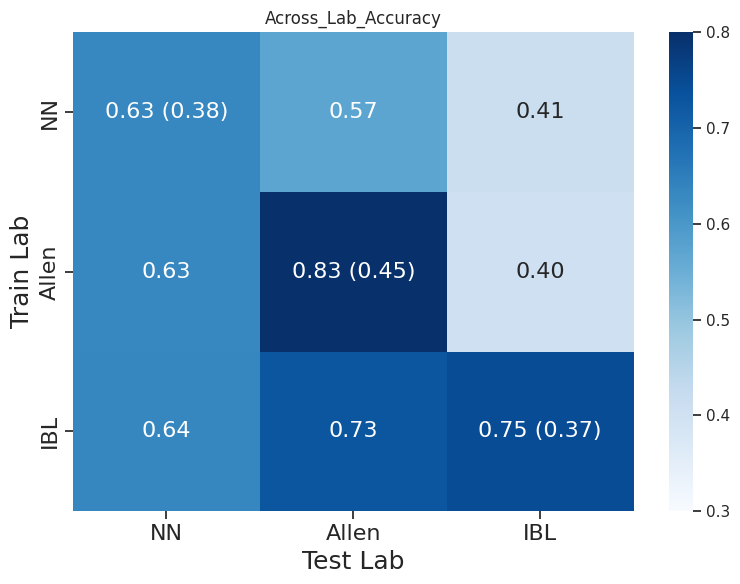

In [70]:
plot_confusion_matrix(across_lab_acc_mtx, raw_cm, labs, title='Across_Lab_Accuracy', format='.2f', vmin=0.3, vmax=0.8)

In [59]:
accross_lab_acc_raw = {
  "IBL_train_Allen_val_NN_test": {
    "train": 0.93,
    "val": 0.59,
    "test": 0.45
  },
  "Allen_train_NN_val_IBL_test": {
    "train": 0.93,
    "val": 0.58,
    "test": 0.49
  },
  "Allen_train_IBL_val_NN_test": {
    "train": 0.81,
    "val": 0.45,
    "test": 0.45
  },
  "NN_train_IBL_val_Allen_test": {
    "train": 0.75,
    "val": 0.33,
    "test": 0.32
  },
  "NN_train_Allen_val_IBL_test": {
    "train": 0.77,
    "val": 0.47,
    "test": 0.35
  },
  "IBL_train_NN_val_Allen_test": {
    "train": 0.95,
    "val": 0.48,
    "test": 0.56
  }
}

In [60]:
across_lab_raw_acc_mtx = np.zeros((3, 3))
labs = ['NN','Allen', 'IBL']

for i, train_lab in enumerate(labs):
    for j, test_lab in enumerate(labs):
        if train_lab != test_lab:
            val_lab = [l for l in labs if l != train_lab and l != test_lab][0]
            across_lab_raw_acc_mtx[i][j] = accross_lab_acc_raw[f"{train_lab}_train_{val_lab}_val_{test_lab}_test"]['test']

In [61]:
across_lab_raw_acc_mtx
for i in range(len(across_lab_raw_acc_mtx)):
    across_lab_raw_acc_mtx[i][i] = across_lab_acc_mtx[i][i]

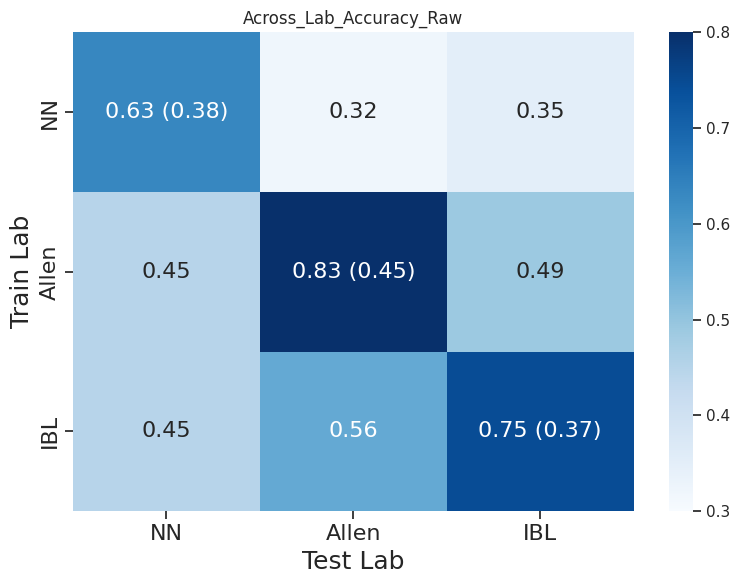

In [71]:
plot_confusion_matrix(across_lab_raw_acc_mtx, raw_cm, labs, title='Across_Lab_Accuracy_Raw', format='.2f', vmin=0.3, vmax=0.8)

In [16]:
monkey_wav2vec = {
  "221007": {
    "train_acc": 0.9985720486111112,
    "val_acc": 0.9899450231481481,
    "test_acc": 0.8375048225308642,
    "train_chance_acc": 0.3333333333333333,
    "val_chance_acc": 0.3333333333333333,
    "test_chance_acc": 0.3333333333333333
  },
  "221104": {
    "train_acc": 0.9970524267399268,
    "val_acc": 0.9912405303030303,
    "test_acc": 0.7894965277777778,
    "train_chance_acc": 0.3333333333333333,
    "val_chance_acc": 0.3333333333333333,
    "test_chance_acc": 0.3333333333333333
  },
  "221216": {
    "train_acc": 0.9966145833333333,
    "val_acc": 0.9893738026819924,
    "test_acc": 0.8560233410493827,
    "train_chance_acc": 0.3333333333333333,
    "val_chance_acc": 0.3333333333333333,
    "test_chance_acc": 0.3333333333333333
  }
}

In [17]:
monkey_spectrogram = {
    "221007": {
      "CA": 0.33333,
      "BTA": 0.67491,
      "BTF1": 0.67295,
      "TA": 0.67491,
      "TF1": 0.67491
    },
    "221104": {
      "CA": 0.33333,
      "BTA": 0.70081,
      "BTF1": 0.68901,
      "TA": 0.70081,
      "TF1": 0.70081
    },
    "221216": {
      "CA": 0.33333,
      "BTA": 0.68815,
      "BTF1": 0.67767,
      "TA": 0.68815,
      "TF1": 0.68815
    }
}

In [18]:
monkey_raw = {
    "221007": {
      "CA": 0.33333,
      "BTA": 0.78378,
      "BTF1": 0.78295,
      "TA": 0.78378,
      "TF1": 0.78378
    },
    "221104": {
      "CA": 0.33333,
      "BTA": 0.69922,
      "BTF1": 0.69199,
      "TA": 0.69922,
      "TF1": 0.69922
    },
    "221216": {
      "CA": 0.33333,
      "BTA": 0.67354,
      "BTF1": 0.67802,
      "TA": 0.67354,
      "TF1": 0.67354
    }
}

In [19]:
monkey_acc_ls = []

for current_session in monkey_raw.keys():
    result = {"model": "raw", "session": current_session, 'test_acc': monkey_raw[current_session]['TA']}
    monkey_acc_ls.append(result)

for current_session in monkey_spectrogram.keys():
    result = {"model": "spectrogram", "session": current_session, 'test_acc': monkey_spectrogram[current_session]['TA']}
    monkey_acc_ls.append(result)

for current_session in monkey_wav2vec.keys():
    result = {"model": "wav2vec", "session": current_session, 'test_acc': monkey_wav2vec[current_session]['test_acc']}
    monkey_acc_ls.append(result)

In [20]:
monkey_acc_df = pd.DataFrame(monkey_acc_ls)
monkey_acc_df

,model,session,test_acc
0,raw,221007,0.783780
1,raw,221104,0.699220
2,raw,221216,0.673540
3,spectrogram,221007,0.674910
4,spectrogram,221104,0.700810
5,spectrogram,221216,0.688150
6,wav2vec,221007,0.837505
7,wav2vec,221104,0.789497
8,wav2vec,221216,0.856023


/state/partition1/job-60565108/ipykernel_3224704/1500377611.py:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  ax = sns.barplot(
/state/partition1/job-60565108/ipykernel_3224704/1500377611.py:5: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1.5}` instead.

  ax = sns.barplot(


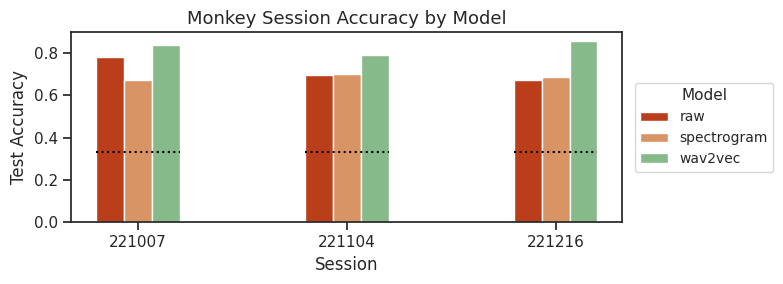

In [27]:
plt.figure(figsize=(8, 3))

color_map = {'raw':'#d43000', 'spectrogram':'#ed9051', 'wav2vec':'#7ec282'}

ax = sns.barplot(
    x='session', 
    y='test_acc', 
    hue='model', 
    data=monkey_acc_df, 
    palette=color_map, 
    ci='sd',        # show standard deviation
    capsize=0.1,     # adds caps to error bars
    errwidth=1.5,
    width=0.4
)

x_coords = ax.get_xticks()
bar_width = 0.4  # same as the width in sns.barplot

# Loop through each group position
for x in x_coords:
    # center of group ± half width of grouped bars
    ax.hlines(
        y=0.3333,                          # chance accuracy
        xmin=x - bar_width / 2,        # left edge of group
        xmax=x + bar_width / 2,        # right edge of group
        colors='black', 
        linestyles='dotted', 
        linewidth=1.5
    )

# Axis and title formatting
ax.set_xlabel("Session", fontsize=12)
ax.set_ylabel("Test Accuracy", fontsize=12)
ax.set_title("Monkey Session Accuracy by Model", fontsize=13)

# Improve legend
ax.legend(title='Model', title_fontsize=11, fontsize=10, frameon=True, loc='center left', bbox_to_anchor=(1.01, 0.5))

# Tidy layout
plt.tight_layout()
plt.savefig("monkey_model_accuracy.png", dpi=300)
plt.show()

### Figure 4

In [9]:
disease_path = "/scratch/th3129/region_decoding/results/Neuronexus/spectrogram_preprocessed/wave2vec2/across_session/disease_pretrained_nossl_fold2_results.pickle"
# disease_path = "/scratch/nar8991/LFP_CLEAN/region_decoding/results_FOR_EMBEDDINGS_new/AD/spectrogram/BrainBERT/new_format/('AD_HF01_1', 'NN_syn_01')_across_session.pickle"
# disease_path = "/scratch/nar8991/LFP_CLEAN/region_decoding/results/AD/lfp/SimCLR_MLP/('AD_HF01_1', 'NN_syn_02')_results.pickle"
saved_data = read_pickle(disease_path)


In [10]:
print(saved_data.keys())

dict_keys(['train_logits', 'train_labels', 'train_acc', 'train_embeddings', 'train_trial_chans', 'val_logits', 'val_labels', 'val_acc', 'val_embeddings', 'val_trial_chans', 'test_logits', 'test_labels', 'test_acc', 'test_embeddings', 'test_trial_chans', 'train_label_counts', 'train_chance_accuracy', 'val_label_counts', 'val_chance_accuracy', 'test_label_counts', 'test_chance_accuracy', 'w2v2_config', 'best_ckpt_path'])


In [21]:
test_trial_chans = saved_data['test_trial_chans']
session_trial_channel = np.array([s.rsplit("_", 2) for s in test_trial_chans])

ad_mask = np.char.find(session_trial_channel[:, 0], 'AD') != -1
ad_trials = session_trial_channel[ad_mask][:, 1].astype(int)
ad_channels = session_trial_channel[ad_mask][:, 2].astype(int)

nn_trials = session_trial_channel[~ad_mask][:, 1].astype(int)
nn_channels = session_trial_channel[~ad_mask][:, 2].astype(int)

In [12]:
test_trial_chans.shape

(12840,)

In [13]:
print(saved_data['test_acc'])
labels = np.array(saved_data['test_labels']).astype(int)

if isinstance(saved_data['test_logits'], torch.Tensor):
    logits = saved_data['test_logits'].detach().cpu().numpy()
    pred = np.argmax(logits, axis=1)
else:
    logits = np.array(saved_data['test_logits'])
    pred = np.argmax(logits, axis=1)

0.9397196261682244


In [14]:
f1_macro = f1_score(labels, pred, average='macro')
print(f1_macro)

0.9396884346685639


In [15]:
def plot_confusion_matrix(cm, class_labels, title='Confusion Matrix', format='.2f'):
    sns.heatmap(cm, annot=True, fmt=format, cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.savefig('bb_disease.png')

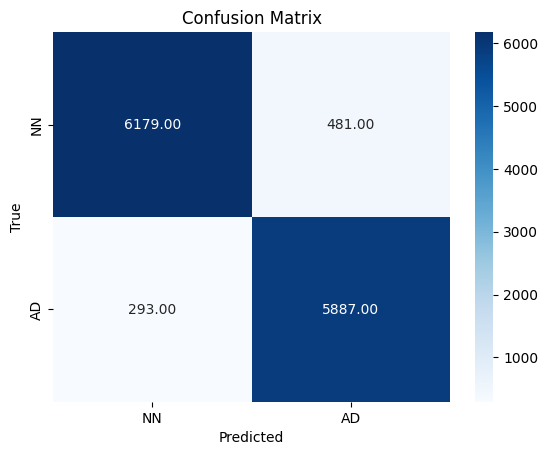

In [16]:
cm = confusion_matrix(labels, pred, labels=range(2))
plot_confusion_matrix(cm, ['NN', 'AD'])

In [18]:
def vis_pie_chart_simple(logits, labels, trial_idx, channel_idx, mode, acc, figure_name, labels_tf=None, labels_sf=None):
    """
    logits: logits from the model
    labels: labels from the model
    trial_idx: trial indices
    channel_idx: channel indices
    mode: mode of the pie chart
    acc: accuracy of the model
    figure_name: name of the figure
    labels_tf: labels from the temporal smoothing
    labels_sf: labels from the spatial filtering
    """
    print("drawing pie chart...")
    print(f"logits: {logits}, labels: {labels}, trial_idx: {trial_idx}, channel_idx: {channel_idx}")
    
    region_colors = {
        "NN": "blue", 
        "AD": "orange"
    }
    regions = list(region_colors.keys())
    
    if labels_tf is not None and labels_sf is not None:
        fig, (ax, ax_label, ax_tf, ax_sf) = plt.subplots(4, 1, figsize=(60, 112))  # Adjusted figsize for better resolution
    else:
        fig, (ax, ax_label) = plt.subplots(2, 1, figsize=(60, 56))  # Adjusted figsize for better resolution
    pie_size = 0.4  # Increase pie size for better visibility

    ### layout parameters
    shank_offset = 15
    num_shanks = 8
    channels_per_shank = 128

    ### circle
    axes_need_equal = [ax, ax_label]
    if labels_tf is not None and labels_sf is not None:
        axes_need_equal.extend([ax_tf, ax_sf])

    for a in axes_need_equal:
        # 1-to-1 units on both axes → perfect circles & wedges
        a.set_aspect('equal', adjustable='box')   # or a.set_box_aspect(1) on mpl ≥ 3.4


    # Get unique trials and create a mapping from trial number to position
    unique_trials = sorted(set(trial_idx))
    trial_to_pos = {trial: pos for pos, trial in enumerate(unique_trials)}
    
    for idx, (logit, label, trial, channel) in tqdm(enumerate(zip(logits, labels, trial_idx, channel_idx)), total=len(logits), desc="Processing"):
        probabilities = softmax(logit)
        angles = probabilities * 360
        start_angle = 0

        ## position
        shank_idx = channel // channels_per_shank
        channel_in_shank = channel % channels_per_shank
        # Use trial_to_pos mapping to get the x coordinate
        x_coord = trial_to_pos[trial] + shank_idx * shank_offset
        y_coord = channel_in_shank
        ##

        for region_idx, (region, angle) in enumerate(zip(regions, angles)):
            if angle > 0:
                wedge = Wedge((x_coord, y_coord), pie_size, start_angle, 
                            start_angle + angle, facecolor=region_colors[region],
                            alpha=0.8, linewidth=0)
                ax.add_patch(wedge)
                start_angle += angle
        
        # Add a circle for the label
        region_name = regions[label]
        circle = plt.Circle((x_coord, y_coord), pie_size, color=region_colors[region_name], alpha=0.8)
        ax_label.add_patch(circle)

        # temporal smoothing
        if labels_tf is not None and labels_sf is not None:
            region_name_tf = regions[labels_tf[idx]]
            circle_tf = plt.Circle((x_coord, y_coord), pie_size, color=region_colors[region_name_tf], alpha=0.8)
            ax_tf.add_patch(circle_tf)

            region_name_sf = regions[labels_sf[idx]]
            circle_sf = plt.Circle((x_coord, y_coord), pie_size, color=region_colors[region_name_sf], alpha=0.8)
            ax_sf.add_patch(circle_sf)

    x_max = shank_offset * num_shanks
    y_max = channels_per_shank
    ax.set_xlim(-1, x_max)
    ax.set_ylim(-1, y_max)
    ax.set_xlabel("Trial Index", fontsize=14)
    ax.set_ylabel("Channel Index", fontsize=14)

    ax_label.set_xlim(-1, x_max)
    ax_label.set_ylim(-1, y_max)
    ax_label.set_xlabel("Trial Index", fontsize=14)
    ax_label.set_ylabel("Channel Index", fontsize=14)
    ax_label.set_title(f"{mode} ground truth", fontsize=16)

    if labels_tf is not None and labels_sf is not None:
        ax_tf.set_xlim(-1, x_max)
        ax_tf.set_ylim(-1, y_max)
        ax_tf.set_xlabel("Trial Index", fontsize=14)
        ax_tf.set_ylabel("Channel Index", fontsize=14)
        ax_tf.set_title(f"Temporal smoothing", fontsize=16)

        ax_sf.set_xlim(-1, x_max)
        ax_sf.set_ylim(-1, y_max)
        ax_sf.set_xlabel("Trial Index", fontsize=14)
        ax_sf.set_ylabel("Channel Index", fontsize=14)
        ax_sf.set_title(f"Spatial smoothing", fontsize=16)

    # Add shank labels
    for shank in range(num_shanks):
        shank_start = shank * shank_offset
        shank_end = shank_start + len(unique_trials)
        ax.text((shank_start + shank_end) / 2, y_max + 5, f"Shank {shank + 1}", ha='center', fontsize=12)
        ax_label.text((shank_start + shank_end) / 2, y_max + 5, f"Shank {shank + 1}", ha='center', fontsize=12)
        if labels_tf is not None and labels_sf is not None:
            ax_tf.text((shank_start + shank_end) / 2, y_max + 5, f"Shank {shank + 1}", ha='center', fontsize=12)
            ax_sf.text((shank_start + shank_end) / 2, y_max + 5, f"Shank {shank + 1}", ha='center', fontsize=12)

    # Set x-ticks for actual trials for each shank
    trial_ticks = []
    trial_labels = []
    for shank in range(num_shanks):
        for pos, trial in enumerate(unique_trials):
            trial_ticks.append(pos + shank * shank_offset)
            trial_labels.append(str(trial))
    
    ax.set_xticks(trial_ticks)
    ax.set_xticklabels(trial_labels, rotation=45)
    ax_label.set_xticks(trial_ticks)
    ax_label.set_xticklabels(trial_labels, rotation=45)
    if labels_tf is not None and labels_sf is not None:
        ax_tf.set_xticks(trial_ticks)
        ax_tf.set_xticklabels(trial_labels, rotation=45)
        ax_sf.set_xticks(trial_ticks)
        ax_sf.set_xticklabels(trial_labels, rotation=45)
    # title: test accuracy
    temporal_acc = np.sum(labels_tf == labels)/len(labels)
    spatial_acc = np.sum(labels_sf == labels)/len(labels)
    
    # subfigure title
    ax.set_title(f'acc: {acc}')
    if labels_tf is not None and labels_sf is not None:
        ax_tf.set_title(f'temporal acc: {temporal_acc}')
        ax_sf.set_title(f'spatial acc: {spatial_acc}')

    plt.tight_layout()
    plt.savefig(f'{figure_name}.png', dpi=400)
    

drawing pie chart...
logits: [[-1.2216797   1.1738281 ]
 [-0.7529297   0.72802734]
 [-1.3818359   1.3300781 ]
 ...
 [-1.0439453   1.0058594 ]
 [-1.0800781   1.03125   ]
 [-1.4199219   1.359375  ]], labels: [1 1 1 ... 1 1 1], trial_idx: [ 0  5 12 ... 50 54 57], channel_idx: [  41   41   41 ... 1023 1023 1023]


Processing: 100%|██████████| 6180/6180 [00:38<00:00, 158.48it/s]


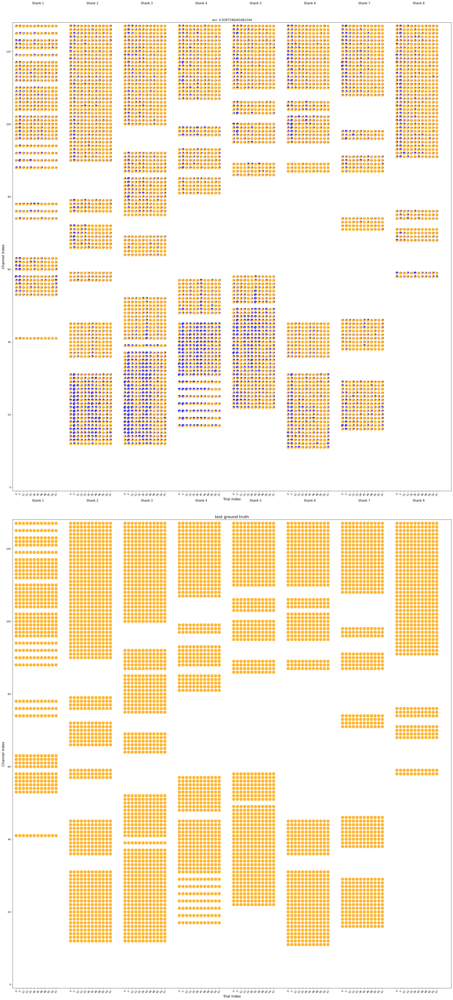

In [19]:
vis_pie_chart_simple(logits[ad_mask], labels[ad_mask], ad_trials, ad_channels, 'test', saved_data['test_acc'], figure_name='ad_channel_trial')

drawing pie chart...
logits: [[ 1.2197266  -1.2724609 ]
 [ 1.7353516  -1.7832031 ]
 [ 0.5727539  -0.6269531 ]
 ...
 [ 0.4650879  -0.49926758]
 [-0.26000977  0.21508789]
 [ 1.1914062  -1.2470703 ]], labels: [0 0 0 ... 0 0 0], trial_idx: [ 0  5 12 ... 50 54 57], channel_idx: [  16   16   16 ... 1023 1023 1023]


Processing: 100%|██████████| 6660/6660 [00:42<00:00, 155.93it/s]


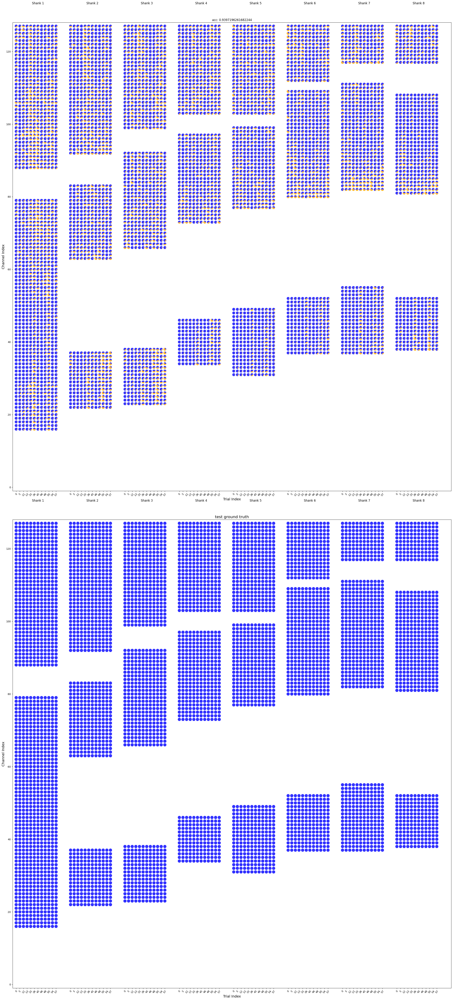

In [22]:
vis_pie_chart_simple(logits[~ad_mask], labels[~ad_mask], nn_trials, nn_channels, 'test', saved_data['test_acc'], figure_name='nn_channel_trial')

In [24]:
disease_path_dict = {
    'simCLR': '/scratch/nar8991/LFP_CLEAN/region_decoding/results/AD/lfp/SimCLR_MLP/',
    'brainbert': '/scratch/nar8991/LFP_CLEAN/region_decoding/results_FOR_EMBEDDINGS_new/AD/spectrogram/BrainBERT/new_format/',
    'wav2vec': '/scratch/th3129/region_decoding/results/Neuronexus/spectrogram_preprocessed/wave2vec2/across_session/'
}

In [19]:
import gc

acc_dict = defaultdict(list)
f1_dict = defaultdict(list)

for model in disease_path_dict.keys():
    for file in os.listdir(disease_path_dict[model]):
        formated_file = file.replace('_across_session.pickle', '_results.pickle')
        current_session = formated_file.replace('_results.pickle', '')
            
        if formated_file.endswith('_results.pickle'):
            if model == 'wav2vec':
                if 'disease_pretrained_nossl' in current_session and 'fold' in current_session:
                    print(f"Loading {file}...")
                    saved_data = read_pickle(disease_path_dict[model] + file)
                    _, _, f1 = extract_class_acc(saved_data)
                    acc_dict[model].append(saved_data['test_acc'])
                    f1_dict[model].append(f1['f1_micro'])
            else:
                test_sessions = formated_file.replace('(', '').replace(')', '').replace("'", "").replace('_results.pickle', '').split(', ')
                if any(test_sessions[0] in session for session in sessions['Neuronexus'])\
                     and any(test_sessions[1] in session for session in sessions['Neuronexus']):
                    print(f"Loading {file}...")
                    saved_data = read_pickle(disease_path_dict[model] + file)
                    _, _, f1 = extract_class_acc(saved_data)
                    acc_dict[model].append(saved_data['test_acc'])
                    f1_dict[model].append(f1['f1_micro'])
                    
                    if model == 'brainbert':
                        del saved_data
                        gc.collect()

Loading ('AD_HF02_2', 'NN_syn_01')_results.pickle...
Loading ('AD_HF03_2', 'NN_syn_02')_results.pickle...
Loading ('AD_HF02_4', 'NN_syn_02')_results.pickle...
Loading ('AD_HF03_1', 'NN_syn_01')_results.pickle...
Loading ('AD_HF02_2', 'NN_syn_02')_results.pickle...
Loading ('AD_HF02_4', 'NN_syn_01')_results.pickle...
Loading ('AD_HF03_1', 'NN_syn_02')_results.pickle...
Loading ('AD_HF03_2', 'NN_syn_01')_results.pickle...
Loading ('AD_HF01_1', 'NN_syn_02')_results.pickle...
Loading ('AD_HF02_2', 'NN_syn_02')_across_session.pickle...
Loading ('AD_HF02_4', 'NN_syn_01')_across_session.pickle...
Loading ('AD_HF02_4', 'NN_syn_02')_across_session.pickle...
Loading ('AD_HF01_1', 'NN_syn_01')_across_session.pickle...
Loading ('AD_HF03_1', 'NN_syn_01')_across_session.pickle...
Loading ('AD_HF03_2', 'NN_syn_01')_across_session.pickle...
Loading ('AD_HF03_2', 'NN_syn_02')_across_session.pickle...
Loading ('AD_HF01_1', 'NN_syn_02')_across_session.pickle...
Loading ('AD_HF02_2', 'NN_syn_01')_across_s

In [20]:
print(dict(f1_dict))
print(dict(acc_dict))

{'simCLR': [0.697196261682243, 0.26842362127867253, 0.5596978557504874, 0.5522930648769575, 0.5461922596754057, 0.6335927367055771, 0.4133034379671151, 0.40425790754257906, 0.5660416666666667], 'brainbert': [0.5142009987515606, 0.5416666666666666, 0.46637426900584794, 0.6453133666112035, 0.5837061894108874, 0.2291970802919708, 0.23987310883357735, 0.546875, 0.616822429906542, 0.38238041853512705], 'wav2vec': [0.8533430941922889, 0.8904603438713256, 0.9344195849546044, 0.8261805555555556, 0.9397196261682244, 0.8558911260253542, 0.9125304136253042, 0.8251121076233184, 0.8577810266406758, 0.8291978776529338]}
{'simCLR': [0.697196261682243, 0.26842362127867253, 0.5596978557504874, 0.5522930648769575, 0.5461922596754057, 0.6335927367055771, 0.4133034379671151, 0.40425790754257906, 0.5660416666666667], 'brainbert': [0.5307753530317129, 0.5742109974668115, 0.5045013616547322, 0.6180189463033358, 0.6228586994073719, 0.5145068145068145, 0.5205389020262438, 0.5088451311892511, 0.6298725910376396

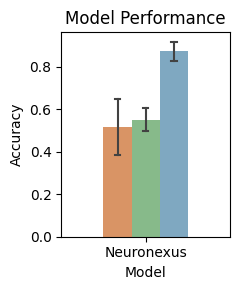

In [21]:
import seaborn as sns

rows = []
for model, scores in acc_dict.items():
    for score in scores:
        rows.append({'model': model, 'score': score})
df = pd.DataFrame(rows)
df['dataset'] = 'Neuronexus'

color_map = {'Raw':'#d43000', 'Spectrogram':'#d43000', 'simCLR':'#ed9051', 'brainbert':'#7ec282', 'wav2vec':'#74abcc'}

plt.figure(figsize=(2.5, 3))

ax = sns.barplot(
    x='dataset', 
    y='score', 
    hue='model', 
    data=df, 
    palette=color_map, 
    capsize=0.1,     # adds caps to error bars
    errorbar='sd',
    err_kws={'linewidth': 1.5},
    width=0.5
)

plt.title('Model Performance')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.legend().remove()
plt.tight_layout()
plt.savefig('disease_accuracy.png', dpi=300)
plt.show()

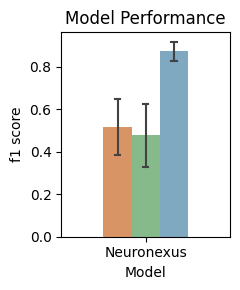

In [22]:
rows = []
for model, scores in f1_dict.items():
    for score in scores:
        rows.append({'model': model, 'score': score})
df = pd.DataFrame(rows)
df['dataset'] = 'Neuronexus'

color_map = {'Raw':'#d43000', 'Spectrogram':'#d43000', 'simCLR':'#ed9051', 'brainbert':'#7ec282', 'wav2vec':'#74abcc'}

plt.figure(figsize=(2.5, 3))

ax = sns.barplot(
    x='dataset', 
    y='score', 
    hue='model', 
    data=df, 
    palette=color_map, 
    capsize=0.1,     # adds caps to error bars
    errorbar='sd',
    err_kws={'linewidth': 1.5},
    width=0.5
)

plt.title('Model Performance')
plt.xlabel('Model')
plt.ylabel('f1 score')
plt.legend().remove()
plt.tight_layout()
plt.savefig('disease_f1.png', dpi=300)
plt.show()

In [26]:
def load_preprocessed_data(pickle_path, file_path, data_type='raw'):
    features, labels, trials, chans = {}, {}, {}, {}
    for session in file_path:
        if data_type == 'raw':
            data = pickle.load(open(f"{pickle_path}/{session}_full_raw.pickle", 'rb'))
        elif data_type == 'lfp':
            data = pickle.load(open(f"{pickle_path}/{session}_full_lfp.pickle", 'rb'))
        X, y, trial_idx, chan_id = zip(*[(d[0], d[1], d[2], d[3]) for d in data])
        X = [x if x.shape[0] == 3749 else x[:3749] for x in X]
        features[session] = np.array(X)
        labels[session] = np.array(y, dtype=int)
        trials[session] = np.array(trial_idx)
        chans[session] = np.array(chan_id)

        non_zero_indices = [i for i, x in enumerate(features[session]) if not np.all(x == 0)]

        features[session] = features[session][non_zero_indices]
        labels[session] = labels[session][non_zero_indices]
        trials[session] = trials[session][non_zero_indices]
        chans[session] = chans[session][non_zero_indices]

        # Sanity check
        assert len(features[session]) == len(labels[session]) == len(trials[session]) == len(chans[session]), \
            f"Inconsistent data sizes for session {session}"

    return features, labels, trials, chans

def split_trials(trial_length, fixed_test_count=12, val_size=0.25, random_state=42):
    if not isinstance(trial_length, int) or trial_length < fixed_test_count + 4:
        raise ValueError(f"trial_length must be greater than {fixed_test_count + 4}")

    print("trial_length:", trial_length)

    all_indices = np.arange(trial_length)
    test_tr_idx = np.random.RandomState(seed=random_state).choice(all_indices, size=fixed_test_count, replace=False)

    remaining_indices = np.setdiff1d(all_indices, test_tr_idx)
    train_tr_idx, val_tr_idx = train_test_split(remaining_indices, test_size=val_size, random_state=random_state)

    print("Train indices:", train_tr_idx)
    print("Validation indices:", val_tr_idx)
    print("Test indices:", test_tr_idx)

    return train_tr_idx, val_tr_idx, test_tr_idx

In [24]:
file_path = np.unique(session_trial_channel[:, 0])
file_path

array(['AD_HF02_2', 'NN_syn_01'], dtype='<U9')

In [27]:
pickle_path = f'/scratch/th3129/region_decoding/data/Neuronexus/lfp'
acronyms_arr = ['CA1', 'CA2', 'CA3', 'DG', 'Cortex']
label_json = {str(i): region for i, region in enumerate(acronyms_arr)}

def process_data(pickle_path, file_path, label_json):

    test_features, test_labels, test_trials, test_chans = load_preprocessed_data(pickle_path, file_path, data_type='lfp')
    features, brain_labels, trials, chans = [], [], [], []
    test_sess_labels, test_trial_chans = [], []
    
    for sessions in file_path:
        temp_features = test_features.get(sessions)
        temp_features = [f if f.shape[0] == 3749 else f[:3749] for f in temp_features]
        temp_features = np.array(temp_features)
    
        features.extend(temp_features)
        brain_labels.extend(test_labels.get(sessions))
        trials.extend(test_trials.get(sessions))
        chans.extend(test_chans.get(sessions))
    
        temp_test_labels = test_labels.get(sessions)
        temp_test_labels = [f"{sessions}_{label_json[str(label)]}" for label in temp_test_labels]
        test_sess_labels.extend(temp_test_labels)
    
        temp_trials = test_trials.get(sessions)
        temp_test_chans = test_chans.get(sessions)
        temp_test_chans = [f"{sessions}_{str(temp_trials[i])}_{str(temp_test_chans[i])}" for i in
                           range(len(temp_trials))]
        test_trial_chans.extend(temp_test_chans)
    
    
    features = np.array(features)
    brain_labels = np.array(brain_labels)
    trials = np.array(trials)
    test_trial_chans = np.array(test_trial_chans)
    test_sess_labels = np.array(test_sess_labels)

    train_tr_idx, val_tr_idx, test_tr_idx = split_trials(trial_length=60)
    test_idx = [idx for idx, val in enumerate(trials) if val in test_tr_idx]
    
    X_test, y_test = features[test_idx], brain_labels[test_idx]
    test_sess_labels = test_sess_labels[test_idx]
    test_trial_chans = test_trial_chans[test_idx]

    return X_test, y_test, test_trial_chans

In [28]:
X_test, y_test, test_trial_chans = process_data(pickle_path, file_path, label_json)

trial_length: 60
Train indices: [ 8 47 39 17 21 56 19 11 20 34 38 58  1 37 35  7 15 40  2 55 25  3 42 41
 27 51 14 26 22 59 24  9 52 18 32 44]
Validation indices: [31 49 30 53 28 43 16 23  6 29 10  4]
Test indices: [ 0  5 36 45 13 54 33 48 12 57 46 50]


In [40]:
(saved_data['test_trial_chans'] == test_trial_chans).all()

True

In [41]:
X_session_trial_channel = np.array([s.rsplit("_", 2) for s in test_trial_chans])

X_ad_mask = np.char.find(X_session_trial_channel[:, 0], 'AD') != -1
X_ad_trials = X_session_trial_channel[ad_mask][:, 1].astype(int)
X_ad_channels = X_session_trial_channel[ad_mask][:, 2].astype(int)
X_ad_features = X_test[ad_mask]
X_ad_regions = y_test[ad_mask]

In [42]:
X_ad_trials.shape, X_ad_channels.shape, X_ad_features.shape, X_ad_regions.shape, logits[ad_mask].shape, labels.shape

((6180,), (6180,), (6180, 3749), (6180,), (6180, 2), (12840,))

In [43]:
preds = np.argmax(logits[ad_mask], axis=1)

region_df = pd.DataFrame({
    'region': X_ad_regions,
    'label': labels[ad_mask],
    'pred': preds
})

region_accuracy = region_df.groupby('region').apply(lambda df: accuracy_score(df['label'], df['pred']))
region_accuracy = region_accuracy.reset_index(name='accuracy')

/state/partition1/job-60921372/ipykernel_1696674/2967854700.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  region_accuracy = region_df.groupby('region').apply(lambda df: accuracy_score(df['label'], df['pred']))


In [44]:
region_accuracy

,region,accuracy
0,0,0.972222
1,1,0.995370
2,3,0.896597
3,4,0.990610


In [29]:
model = 'wav2vec'
region_accuracy = {}

for file in os.listdir(disease_path_dict[model]):
    formated_file = file.replace('_across_session.pickle', '_results.pickle')
    current_session = formated_file.replace('_results.pickle', '')
        
    if formated_file.endswith('_results.pickle'):
        if 'disease_pretrained_nossl' in current_session and 'fold' in current_session:
            print(f"Loading {file}...")
            saved_data = read_pickle(disease_path_dict[model] + file)
            labels = np.array(saved_data['test_labels']).astype(int)
            logits = np.array(saved_data['test_logits'])

            test_trial_chans = saved_data['test_trial_chans']
            session_trial_channel = np.array([s.rsplit("_", 2) for s in test_trial_chans])

            file_path = np.unique(session_trial_channel[:, 0])
            ad_mask = np.char.find(session_trial_channel[:, 0], 'NN') != -1

            X_test, y_test, X_test_trial_chans = process_data(pickle_path, file_path, label_json)
            X_session_trial_channel = np.array([s.rsplit("_", 2) for s in X_test_trial_chans])
            
            X_ad_mask = np.char.find(X_session_trial_channel[:, 0], 'NN') != -1
            X_ad_trials = X_session_trial_channel[X_ad_mask][:, 1].astype(int)
            X_ad_channels = X_session_trial_channel[X_ad_mask][:, 2].astype(int)
            X_ad_features = X_test[ad_mask]
            X_ad_regions = y_test[ad_mask]

            preds = np.argmax(logits[ad_mask], axis=1)
            labels = labels[ad_mask]
            
            for region in np.unique(X_ad_regions):
                region_mask = (X_ad_regions == region)
                acc = accuracy_score(labels[region_mask], preds[region_mask])

                if region not in region_accuracy:
                    region_accuracy[region] = []
                region_accuracy[region].append(acc)

Loading disease_pretrained_nossl_fold9_results.pickle...
trial_length: 60
Train indices: [ 8 47 39 17 21 56 19 11 20 34 38 58  1 37 35  7 15 40  2 55 25  3 42 41
 27 51 14 26 22 59 24  9 52 18 32 44]
Validation indices: [31 49 30 53 28 43 16 23  6 29 10  4]
Test indices: [ 0  5 36 45 13 54 33 48 12 57 46 50]
Loading disease_pretrained_nossl_fold0_results.pickle...
trial_length: 60
Train indices: [ 8 47 39 17 21 56 19 11 20 34 38 58  1 37 35  7 15 40  2 55 25  3 42 41
 27 51 14 26 22 59 24  9 52 18 32 44]
Validation indices: [31 49 30 53 28 43 16 23  6 29 10  4]
Test indices: [ 0  5 36 45 13 54 33 48 12 57 46 50]
Loading disease_pretrained_nossl_fold4_results.pickle...
trial_length: 60
Train indices: [ 8 47 39 17 21 56 19 11 20 34 38 58  1 37 35  7 15 40  2 55 25  3 42 41
 27 51 14 26 22 59 24  9 52 18 32 44]
Validation indices: [31 49 30 53 28 43 16 23  6 29 10  4]
Test indices: [ 0  5 36 45 13 54 33 48 12 57 46 50]
Loading disease_pretrained_nossl_fold1_results.pickle...
trial_length:

In [33]:
reversed_accuracy

{0: [0.11284722222222221,
  0.007699275362318847,
  0.05389492753623193,
  0.31365740740740744,
  0.05978260869565222,
  0.0018115942028985588,
  0.0018115942028985588,
  0.11284722222222221,
  0.1753472222222222,
  0.25752314814814814],
 1: [0.21969696969696972,
  0.009615384615384581,
  0.0608974358974359,
  0.49242424242424243,
  0.08012820512820518,
  0.0032051282051281937,
  0.0032051282051281937,
  0.21969696969696972,
  0.2727272727272727,
  0.446969696969697],
 2: [0.03797468354430378,
  0.023809523809523836,
  0.07380952380952377,
  0.17194092827004215,
  0.07857142857142863,
  0.0023809523809523725,
  0.0023809523809523725,
  0.03797468354430378,
  0.15084388185654007,
  0.2310126582278481],
 3: [0.11480186480186483,
  0.009146341463414642,
  0.024390243902439046,
  0.23135198135198132,
  0.022357723577235755,
  0.0030487804878048808,
  0.0030487804878048808,
  0.11480186480186483,
  0.256993006993007,
  0.32925407925407923],
 4: [0.07727272727272727,
  0.012521588946459383,


In [32]:
reversed_accuracy = {key: [1 - v for v in val] for key, val in region_accuracy.items()}

/state/partition1/job-60973949/ipykernel_1336906/2089633731.py:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend().remove()


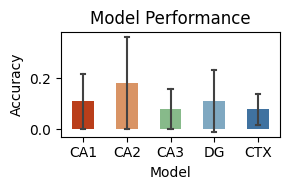

In [46]:
rows = []
brain_regions = ['CA1', 'CA2', 'CA3', 'DG', 'CTX']

for region, scores in reversed_accuracy.items():
    for score in scores:
        rows.append({'region': brain_regions[region], 'score': score, 'label': region})
df = pd.DataFrame(rows)
df['dataset'] = 'Neuronexus'
df = df.sort_values(by=['label'])

color_map = {'CA1':'#d43000', 'CA2':'#ed9051', 'CA3':'#7ec282', 'DG':'#74abcc', 'CTX':'#3072b0'}

plt.figure(figsize=(3, 2))

ax = sns.barplot(
    x='region', 
    y='score', 
    hue='region', 
    data=df, 
    palette=color_map, 
    capsize=0.1,     # adds caps to error bars
    errorbar='sd',
    err_kws={'linewidth': 1.5},
    width=0.5
)

plt.title('Model Performance')
plt.xlabel('Model')
plt.ylabel('Accuracy')
# plt.ylim(-0.03, 0.3)
plt.legend().remove()
plt.tight_layout()
plt.savefig('nn_region.png', dpi=300)

In [69]:
def calculate_psd(data, sampling_rate, freq_range=None):
    freqs, Pxx = welch(data, fs=sampling_rate, nperseg=1024)

    if freq_range is not None:
        min_freq, max_freq = freq_range
        if max_freq == -1:
            mask = (freqs >= min_freq)
        else:
            mask = (freqs >= min_freq) & (freqs <= max_freq)
        freqs = freqs[mask]
        Pxx = Pxx[mask]

    return freqs, Pxx


def calculate_power(data, sampling_rate, freq_range=None):
    freqs, Pxx = calculate_psd(data, sampling_rate, freq_range)
    power = np.trapz(Pxx, freqs)
    return power

In [80]:
theta_power_values = np.array([calculate_power(row, 1500, (4, 8)) for row in X_ad_features])

/state/partition1/job-60913703/ipykernel_3183333/3988951788.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  channel_accuracy = channel_df.groupby('channel').apply(lambda df: accuracy_score(df['label'], df['pred']))


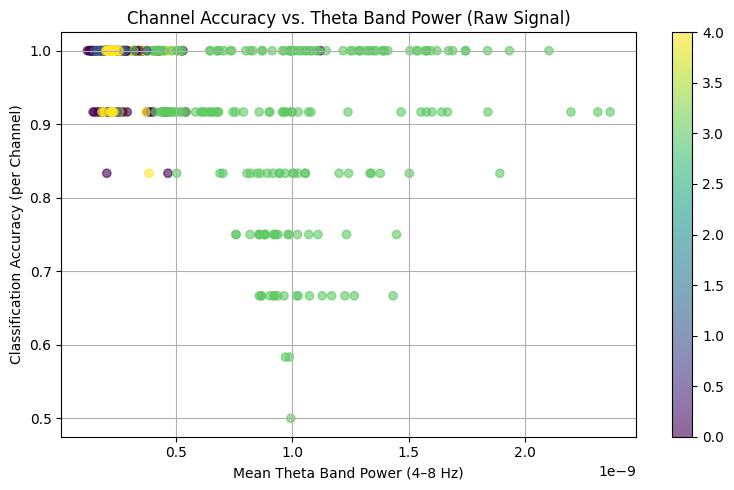

In [82]:
channel_df = pd.DataFrame({
    'channel': X_ad_channels,
    'regions': X_ad_regions,
    'label': labels,
    'pred': preds,
    'theta_power': theta_power_values
})

# Compute accuracy and mean theta power per channel
channel_accuracy = channel_df.groupby('channel').apply(lambda df: accuracy_score(df['label'], df['pred']))
mean_theta_power = channel_df.groupby('channel')['theta_power'].mean()
channel_labels = channel_df.groupby('channel')['regions'].mean()

channel_stats = pd.DataFrame({
    'accuracy': channel_accuracy,
    'theta_power': mean_theta_power,
    'channel_labels': channel_labels
}).reset_index()

# Plot accuracy vs. theta power
plt.figure(figsize=(8, 5))
plt.scatter(channel_stats['theta_power'], channel_stats['accuracy'], alpha=0.6, c=channel_stats['channel_labels'])
plt.xlabel('Mean Theta Band Power (4–8 Hz)')
plt.ylabel('Classification Accuracy (per Channel)')
plt.title('Channel Accuracy vs. Theta Band Power (Raw Signal)')
plt.colorbar()
plt.grid(True)
plt.tight_layout()
plt.show()

### Figure 5

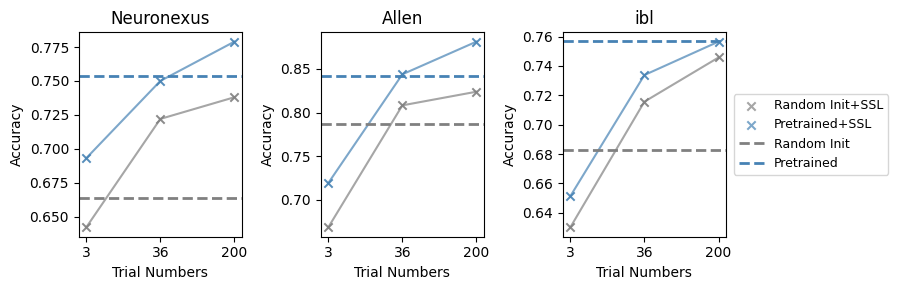

In [17]:
pretrain_ssl_acc = {
    'Neuronexus': [0.693, 0.750, 0.779],
    'Allen': [0.71922, 0.84375, 0.881155],
    'ibl': [0.65123, 0.7338, 0.756559]
}
random_ssl_acc = {
    'Neuronexus': [0.642, 0.722, 0.738],
    'Allen': [0.66856, 0.80824, 0.82386],
    'ibl': [0.63002, 0.71566, 0.74576]
}

n_trials = [3, 36, 200]

# pretrain_acc = 0.754
# random_acc = 0.664
pretrain_acc = {
    'Neuronexus': 0.754,
    'Allen': 0.84138,
    'ibl': 0.7569
}
random_acc = {
    'Neuronexus': 0.664,
    'Allen': 0.78693,
    'ibl': 0.68248    
}

plt.figure(figsize=(9, 3))

for i, key in enumerate(pretrain_ssl_acc.keys()):
    plt.subplot(1, 3, i+1)
    plt.scatter(range(len(random_ssl_acc[key])), random_ssl_acc[key], color='gray', marker='x',label='Random Init+SSL', alpha=0.7)
    plt.scatter(range(len(pretrain_ssl_acc[key])), pretrain_ssl_acc[key], color='steelblue', marker='x',label='Pretrained+SSL', alpha=0.7)
    
    plt.plot(range(len(random_ssl_acc[key])), random_ssl_acc[key], color='gray', marker='x',alpha=0.7)
    plt.plot(range(len(pretrain_ssl_acc[key])), pretrain_ssl_acc[key], color='steelblue', marker='x',alpha=0.7)
    
    plt.axhline(random_acc[key], color='gray', linestyle='--', linewidth=2, label='Random Init')
    plt.axhline(pretrain_acc[key], color='steelblue', linestyle='--', linewidth=2, label='Pretrained')

    # Formatting
    plt.xticks(range(len(n_trials)), n_trials)
    plt.xlabel('Trial Numbers')
    plt.ylabel('Accuracy')
    plt.title(f'{key}')
    # plt.ylim(0.6, 0.82)
    # plt.grid(True, linestyle='--', alpha=0.3)
plt.legend()
plt.legend(fontsize=9, title_fontsize=10, loc='center left', frameon=True, bbox_to_anchor=(1.01, 0.5))
plt.tight_layout()
plt.savefig('ablation_all.png', dpi=300)
plt.show()

### Figure 6

In [4]:
monkey_path_dict = {
    'spectrogram': '/scratch/th3129/region_decoding/results/Monkey/MLP/', 
    'simCLR': '/scratch/mkp6112/LFP/region_decoding/results/Monkey/spectrogram/SimCLR_MLP/',
    'brainbert': '/scratch/nar8991/LFP_CLEAN/region_decoding/results_FOR_EMBEDDINGS_new/Monkey/spectrogram/BrainBERT/new_format/',
    'lfp2vec': '/scratch/mkp6112/LFP/region_decoding/results/Monkey/spectrogram/wave2vec2/across_session/'
}

In [10]:
def extract_class_acc(results):
    if isinstance(results['test_logits'], torch.Tensor):
        logits = results['test_logits'].detach().cpu().numpy()
    else:
        logits = results['test_logits']
    labels = np.array(results['test_labels']).astype(int)
    pred = np.argmax(logits, axis=1)

    class_acc = {}
    brain_regions = ['Basal_Ganglia', 'Suppl_Motor_Area', 'Primary_Motor_Cortex']
    # print(labels)

    for label_cls in np.unique(labels):
        cls_mask = labels == label_cls
        correct = np.sum(pred[cls_mask] == labels[cls_mask])
        total = np.sum(cls_mask)
        class_acc[brain_regions[int(label_cls)]] = correct / total if total > 0 else float('nan')

    cm = confusion_matrix(labels, pred, labels=range(len(brain_regions)))
    f1_macro = f1_score(labels, pred, average='macro')
    f1_micro = f1_score(labels, pred, average='micro')
    f1_weighted = f1_score(labels, pred, average='weighted')
    balanced_acc = balanced_accuracy_score(labels, pred)
    f1 = {"f1_macro": f1_macro, "f1_micro": f1_micro, "f1_weighted": f1_weighted, "balanced_acc": balanced_acc}

    return class_acc, cm, f1

In [12]:
acc_dict = defaultdict(list)
f1_dict = defaultdict(list)
accuracy_ls = []
conf_mtx_dict = defaultdict(list)
test_trials = [0, 5, 36, 45, 13, 54, 33, 48, 12, 57, 46, 50]

for model in monkey_path_dict.keys():
    for file in os.listdir(monkey_path_dict[model]):
        formated_file = file.replace('_across_session.pickle', '_results.pickle')
        current_session = formated_file.replace('_results.pickle', '')
            
        if formated_file.endswith('_results.pickle'):
            if formated_file.endswith('_results.pickle'):
                print(f"Loading {file}...")
                saved_data = read_pickle(monkey_path_dict[model] + file)
                if model == 'brainbert' or model == 'wav2vec':
                    saved_data = edit_pickle_by_trials(saved_data, test_trials, dataset='monkey')
                    
                class_acc, cm, f1 = extract_class_acc(saved_data)
                acc_dict[model].append(saved_data['test_acc'])
                f1_dict[model].append(f1['f1_micro'])
                conf_mtx_dict[model].append(cm)
                result = {"model": model, "dataset": 'monkey', "session": current_session,'train_acc': saved_data['train_acc'], 'val_acc': saved_data['val_acc'], 
                                    'test_acc': saved_data['test_acc']}
                result.update(f1)
                accuracy_ls.append(result)

                if model == 'brainbert':
                    del saved_data
                    gc.collect()

Loading 221104_results.pickle...
Loading 221216_results.pickle...
Loading 221007_results.pickle...
Loading 221104_results.pickle...
Loading 221216_results.pickle...
Loading 221007_results.pickle...
Loading ('221216',)_across_session.pickle...
acc before: 0.7640128968253969, acc after: 0.7294560185185185
Loading ('221104',)_across_session.pickle...
acc before: 0.7505657862103176, acc after: 0.7471064814814815
Loading ('221007',)_across_session.pickle...
acc before: 0.7349330357142857, acc after: 0.7247540509259259
Loading 221104_results.pickle...
Loading 221216_results.pickle...
Loading 221007_results.pickle...


In [13]:
monkey_accuracy = pd.DataFrame(accuracy_ls)
monkey_accuracy['session'] = monkey_accuracy['session'].astype(str).str.replace(r"[^\d]", "", regex=True)
monkey_accuracy

,model,dataset,session,train_acc,val_acc,test_acc,f1_macro,f1_micro,f1_weighted,balanced_acc
0,spectrogram,monkey,221104,0.900342,0.784650,0.700810,0.689013,0.700810,0.689013,0.700810
1,spectrogram,monkey,221216,0.882258,0.727865,0.688151,0.677671,0.688151,0.677671,0.688151
2,spectrogram,monkey,221007,0.781371,0.715639,0.674913,0.672948,0.674913,0.672948,0.674913
3,simCLR,monkey,221104,0.953897,0.847801,0.667318,0.658074,0.667318,0.658074,0.667318
4,simCLR,monkey,221216,0.913170,0.820891,0.794850,0.797435,0.794850,0.797435,0.794850
5,simCLR,monkey,221007,0.849609,0.820385,0.737558,0.732767,0.737558,0.732767,0.737558
6,brainbert,monkey,221216,0.993984,0.859722,0.729456,0.735377,0.729456,0.735377,0.729456
7,brainbert,monkey,221104,0.995346,0.935590,0.747106,0.743200,0.747106,0.743200,0.747106
8,brainbert,monkey,221007,0.988269,0.896296,0.724754,0.700647,0.724754,0.700647,0.724754
9,lfp2vec,monkey,221104,0.991505,0.990372,0.804326,0.802102,0.804326,0.802102,0.804326


/state/partition1/job-61924160/ipykernel_1954055/25229741.py:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  ax = sns.barplot(
/state/partition1/job-61924160/ipykernel_1954055/25229741.py:5: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1.5}` instead.

  ax = sns.barplot(


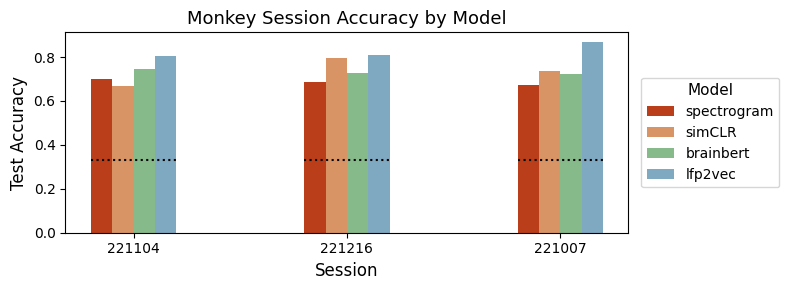

In [13]:
plt.figure(figsize=(8, 3))

color_map = {'spectrogram':'#d43000', 'simCLR':'#ed9051', 'brainbert':'#7ec282', 'lfp2vec':'#74abcc'}

ax = sns.barplot(
    x='session', 
    y='test_acc', 
    hue='model', 
    data=monkey_accuracy, 
    palette=color_map, 
    ci='sd',        # show standard deviation
    capsize=0.1,     # adds caps to error bars
    errwidth=1.5,
    width=0.4
)

x_coords = ax.get_xticks()
bar_width = 0.4  # same as the width in sns.barplot

# Loop through each group position
for x in x_coords:
    # center of group ± half width of grouped bars
    ax.hlines(
        y=0.3333,                          # chance accuracy
        xmin=x - bar_width / 2,        # left edge of group
        xmax=x + bar_width / 2,        # right edge of group
        colors='black', 
        linestyles='dotted', 
        linewidth=1.5
    )

# Axis and title formatting
ax.set_xlabel("Session", fontsize=12)
ax.set_ylabel("Test Accuracy", fontsize=12)
ax.set_title("Monkey Session Accuracy by Model", fontsize=13)

# Improve legend
ax.legend(title='Model', title_fontsize=11, fontsize=10, frameon=True, loc='center left', bbox_to_anchor=(1.01, 0.5))

# Tidy layout
plt.tight_layout()
plt.savefig("monkey_model_accuracy.png", dpi=300)
plt.show()

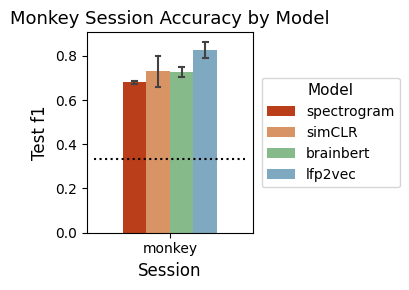

In [20]:
import seaborn as sns

plt.figure(figsize=(4, 3))
color_map = {'spectrogram':'#d43000', 'simCLR':'#ed9051', 'brainbert':'#7ec282', 'lfp2vec':'#74abcc'}

ax = sns.barplot(
    x='dataset', 
    y='f1_macro', 
    hue='model',
    data=monkey_accuracy, 
    palette=color_map, 
    capsize=0.1,     # adds caps to error bars
    errorbar='sd',
    err_kws={'linewidth': 1.5},
    width=0.5
)

x_coords = ax.get_xticks()

# Loop through each group position
# for x in x_coords:
    # center of group ± half width of grouped bars
ax.hlines(
    y=0.3333,                          # chance accuracy
    xmin=x_coords[0] - 0.4,        # left edge of group
    xmax=x_coords[0] + 0.4,        # right edge of group
    colors='black', 
    linestyles='dotted', 
    linewidth=1.5
)

plt.title('Model Performance')
plt.xlabel('Model')
plt.ylabel('f1')
plt.legend().remove()

ax.set_xlabel("Session", fontsize=12)
ax.set_ylabel("Test f1", fontsize=12)
ax.set_title("Monkey Session Accuracy by Model", fontsize=13)

# Improve legend
ax.legend(title='Model', title_fontsize=11, fontsize=10, frameon=True, loc='center left', bbox_to_anchor=(1.01, 0.5))


plt.tight_layout()
plt.savefig('monkey_f1.png', dpi=300)
plt.show()

In [16]:
conf_mtx_dict['lfp2vec'] = np.array([[[12009,1753,62], [1181, 11728, 915], [191, 3237, 10396]]])

In [17]:
conf_mtx_dict

defaultdict(list,
            {'spectrogram': [array([[4496,  100,   12],
                     [2819, 1789,    0],
                     [   0, 1205, 3403]]),
              array([[4504,  104,    0],
                     [1683, 2924,    1],
                     [   2, 2521, 2085]]),
              array([[2757, 1847,    4],
                     [   0, 4605,    3],
                     [   0, 2640, 1968]])],
             'simCLR': [array([[4358,  211,   39],
                     [2605, 1886,  117],
                     [ 686,  941, 2981]]),
              array([[3897,  687,   24],
                     [1059, 3406,  143],
                     [ 186,  737, 3685]]),
              array([[3860,  679,   69],
                     [  73, 2495, 2040],
                     [ 755,   12, 3841]])],
             'brainbert': [array([[3529, 1073,    6],
                     [1059, 3240,  309],
                     [  29, 1264, 3315]]),
              array([[4338,  250,   20],
                     [2178

/state/partition1/job-61770355/ipykernel_3526829/1928338720.py:16: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


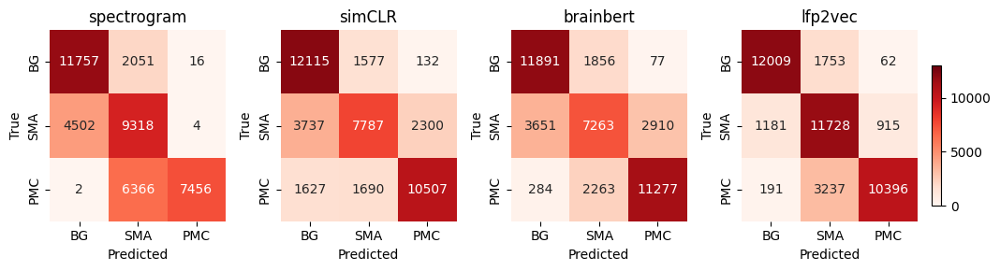

In [18]:
brain_regions = ['BG', 'SMA', 'PMC']
fig = plt.figure(figsize=(10, 3))

for idx, model in enumerate(monkey_path_dict.keys(), 1):
    cm = np.array(conf_mtx_dict[model]).sum(axis=0)
    ax = plt.subplot(1, 4, idx)
    last_heatmap = sns.heatmap(cm, annot=True, fmt='d', cmap='Reds',
                xticklabels=brain_regions, yticklabels=brain_regions, vmin=0, vmax=13000, cbar=False)
    ax.set_xlabel('Predicted', fontsize=10)
    ax.set_ylabel('True', fontsize=10)
    ax.set_title(model, fontsize=12)

cbar_ax = fig.add_axes([1, 0.25, 0.01, 0.5])  # [left, bottom, width, height]
fig.colorbar(last_heatmap.get_children()[0], cax=cbar_ax)

plt.tight_layout()
plt.savefig('monkey_conf.png', bbox_inches='tight', dpi=300)

### Figure 7

In [32]:
import pandas as pd

file_path = '/scratch/th3129/region_decoding/results/results_post.xlsx'
dataset = 'ibl'

xls = pd.ExcelFile(file_path)
print(xls.sheet_names)

# Then read a specific sheet (or the first one by default)
df = pd.read_excel(xls, sheet_name=dataset)  # Replace 'Sheet1' if needed
df = df.rename(columns={"Unnamed: 0": "model"})
df = df[df['model'] != 'raw']
df

['neuronexus', 'allen', 'ibl']


,model,original,temporal,spatial,original_std,temporal_std,spatial_std
0,lfp2vec,0.683,0.736,0.738,0.118990,0.135110,0.137318
1,simclr,0.689,0.742,0.748,0.110122,0.122367,0.123434
2,brainbert,0.709,0.754,0.759,0.102199,0.113567,0.117616
4,spectrogram,0.687,0.725,0.729,0.118161,0.160352,0.166593


In [33]:
accuracy_df

,model,setting,accuracy,std
0,lfp2vec,original,0.646318,0.066797
1,simclr,original,0.461159,0.075290
2,brainbert,original,0.522695,0.075952
3,spectrogram,original,0.380153,0.117910
4,lfp2vec,temporal,0.682426,0.063387
5,simclr,temporal,0.486776,0.088210
6,brainbert,temporal,0.557477,0.095154
7,spectrogram,temporal,0.386758,0.137558
8,lfp2vec,spatial,0.682426,0.063387
9,simclr,spatial,0.486776,0.088210


/state/partition1/job-60977658/ipykernel_3659792/3515274763.py:15: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(data=accuracy_df, x="model", y="accuracy", hue="setting", ci=None, capsize=0.1, errwidth=1, width=0.6, palette=color_map, order=["spectrogram", "simclr", "brainbert", "lfp2vec"])
/state/partition1/job-60977658/ipykernel_3659792/3515274763.py:15: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  ax = sns.barplot(data=accuracy_df, x="model", y="accuracy", hue="setting", ci=None, capsize=0.1, errwidth=1, width=0.6, palette=color_map, order=["spectrogram", "simclr", "brainbert", "lfp2vec"])


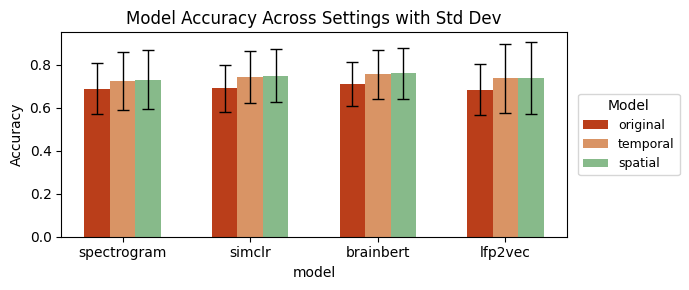

In [34]:
models = df["model"]
settings = ["original", "temporal", "spatial"]
color_map = {'original':'#d43000', 'temporal':'#ed9051', 'spatial':'#7ec282'}

accuracy_df = pd.melt(df, id_vars=["model"], value_vars=settings,
                      var_name="setting", value_name="accuracy")

std_df = pd.melt(df, id_vars=["model"], value_vars=[s + "_std" for s in settings],
                 var_name="setting", value_name="std")

std_df["setting"] = std_df["setting"].str.replace("_std", "")
accuracy_df["std"] = std_df["std"]

plt.figure(figsize=(7, 3))
ax = sns.barplot(data=accuracy_df, x="model", y="accuracy", hue="setting", ci=None, capsize=0.1, errwidth=1, width=0.6, palette=color_map, order=["spectrogram", "simclr", "brainbert", "lfp2vec"])

# Manually add error bars
for bar, std in zip(ax.patches, accuracy_df["std"]):
    x = bar.get_x() + bar.get_width() / 2
    height = bar.get_height()
    ax.errorbar(x, height, yerr=std, ecolor='black', capsize=4, fmt='none', lw=1)

plt.ylabel("Accuracy")
plt.title("Model Accuracy Across Settings with Std Dev")
plt.legend(title='Model', fontsize=9, title_fontsize=10, loc='center left', frameon=True, bbox_to_anchor=(1.01, 0.5))
plt.xticks()
plt.tight_layout()
plt.savefig(f'{dataset}_postprocessing.png', dpi=300)
plt.show()